# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as scs
import seaborn as sns
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import maxabs_scale

In [2]:
# <<< Story >>>

# A problem with BAM Scoring
# Why should I do this in the first place?
# First thing is putting these scores into ranks
# BAM Score is a singular value for a player
# What makes a good BAM Score? 
# Turns out Vertical Jump....not important for dilineating BAM Scores 
# Reaction Shuttle
# --> fast twitch agility
# 4 way agility
# # 

# Import and Clean Data

In [3]:
df = pd.read_excel('dec16-OutboundForAnalysis.xlsx')
df.head()

# This data represents high school basketball athletes trying to move to next level and play in college between 14-18

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Length,Hand Width,Unnamed: 14,Unnamed: 15
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,7.50,8.25,NaN,NaN
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,7.50,8.75,NaN,NaN
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.00,9.50,NaN,NaN
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,8.25,9.25,NaN,NaN
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,8.00,10.00,NaN,NaN


In [4]:
pd.set_option('display.max_columns', 30)

# to preview all columns 

In [5]:
df.columns

Index(['BAMid', 'Approach Vertical', 'Vertical Jump', '3/4 Court sprint  ',
       '4-Way agility', 'Reaction Shuttle', 'BAMScore', 'Wingspan', 'Reach',
       'Height', 'Weight', 'Body Comp', 'Hand Length', 'Hand Width',
       'Unnamed: 14', 'Unnamed: 15'],
      dtype='object')

In [6]:
# dropped last 2 columns because they are messing up data

df.drop(columns=['Unnamed: 14','Unnamed: 15','Hand Length'],inplace=True)

In [7]:
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00


# EDA and Rankings on each parameter

## Visualizing data to find obvious outliers

### Bam Score Rank : 1 = best | 5 = worst
### Paramater Ranks : 5 = best | 1 = worst

In [8]:
new_dict = {1:5,2:4,3:3,4:2,5:1}
new_dict


{1: 5, 2: 4, 3: 3, 4: 2, 5: 1}

## EDA - (1) Approach Vertical

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



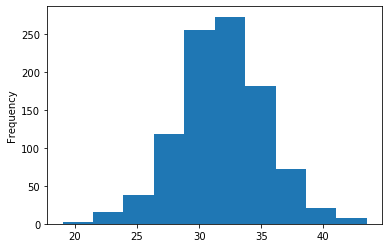

In [9]:
df['Approach Vertical'].plot('hist')
# Visualize + see it's normal dist. If not then look for other factors like outliers and skew

In [10]:
df['Approach Vertical'].describe(), 

(count    986.000000
 mean      31.829615
 std        3.547985
 min       19.000000
 25%       29.500000
 50%       31.750000
 75%       34.000000
 max       43.500000
 Name: Approach Vertical, dtype: float64,)

In [11]:
approach_mu = df['Approach Vertical'].mean()
approach_std = df['Approach Vertical'].std()

min95 = approach_mu-2*approach_std
max95 = approach_mu+2*approach_std


def get_rank_approach_vertical(vert):
    if vert > approach_mu+1*approach_std:
        return 5
    if vert > approach_mu:
        return 4
    if vert > approach_mu - approach_std:
        return 3
    if vert > approach_mu - 2*approach_std:
        return 2
    return 1

# Rank them by percentiles based on scores 
# Rafael - Manually entered to calc std

In [12]:
df['approach_vertical_rank'] = df['Approach Vertical'].apply(get_rank_approach_vertical)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3


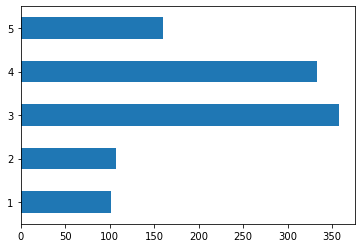

In [13]:
av_rank_counts = pd.value_counts(df['approach_vertical_rank'].values, sort=False)
av_rank_counts.plot.barh()
# Do This to make sure data is decently distributed with a smaller sample size

In [14]:
# Observation - Data looks normal and normally distributed but more weight on rank 4 side

## EDA - (2) Vertical Jump

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



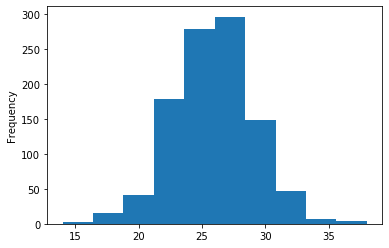

In [15]:
df['Vertical Jump'].plot('hist')

In [16]:
df['Vertical Jump'].describe(), 

(count    1019.000000
 mean       25.860157
 std         3.125301
 min        14.000000
 25%        24.000000
 50%        25.500000
 75%        28.000000
 max        38.000000
 Name: Vertical Jump, dtype: float64,)

In [17]:
vertical_mu = df['Vertical Jump'].mean()
vertical_std = df['Vertical Jump'].std()

min95 = vertical_mu-2*vertical_std
max95 = vertical_mu+2*vertical_std


def get_rank_vertical_jump(vert):
    if vert > vertical_mu+1*vertical_std:
        return 5
    if vert > vertical_mu:
        return 4
    if vert > vertical_mu - vertical_std:
        return 3
    if vert > vertical_mu - 2*vertical_std:
        return 2
    return 1

# Assign Ranks

In [18]:
df['vertical_jump_rank'] = df['Vertical Jump'].apply(get_rank_vertical_jump)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4


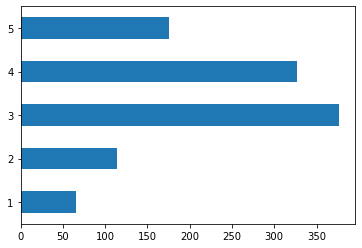

In [19]:
av_rank_counts_vert_jump = pd.value_counts(df['vertical_jump_rank'].values, sort=False)
av_rank_counts_vert_jump.plot.barh()

In [20]:
# Observations - Data looks normal and makes sense - more tall people in the NBA than short.

## EDA - (3) Reaction Shuttle

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



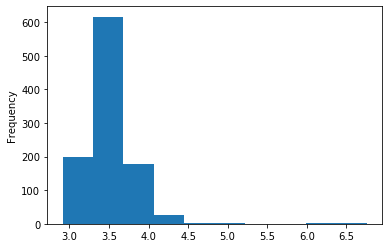

In [21]:
df['Reaction Shuttle'].plot('hist')

In [22]:
df['Reaction Shuttle'].describe(), 

(count    1024.000000
 mean        3.505243
 std         0.278427
 min         2.914000
 25%         3.343750
 50%         3.484000
 75%         3.642250
 max         6.759000
 Name: Reaction Shuttle, dtype: float64,)

In [23]:
shuttle_mu = df['Reaction Shuttle'].mean()
shuttle_std = df['Reaction Shuttle'].std()

min95 = shuttle_mu-2*shuttle_std
max95 = shuttle_mu+2*shuttle_std


def get_rank_reaction_shuttle(shut):
    if shut > shuttle_mu+1*shuttle_std:
        return 5
    if shut > shuttle_mu:
        return 4
    if shut > shuttle_mu - shuttle_std:
        return 3
    if shut > shuttle_mu - 2*shuttle_std:
        return 2
    return 1

In [24]:
df['reaction_shuttle_rank'] = df['Reaction Shuttle'].apply(get_rank_reaction_shuttle)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3


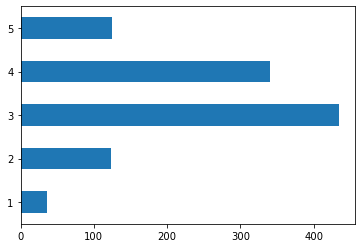

In [25]:
av_rank_counts_shuttle = pd.value_counts(df['reaction_shuttle_rank'].values, sort=False)
av_rank_counts_shuttle.plot.barh()

In [26]:
# Observations - Lots of outliers. Took outliers out and balanced data

## EDA - (4) BAM Score

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



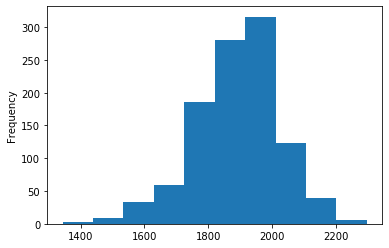

In [27]:
df['BAMScore'].plot('hist')

In [28]:
df['BAMScore'].describe(), 

(count    1056.000000
 mean     1890.976326
 std       135.057644
 min      1343.000000
 25%      1811.000000
 50%      1899.500000
 75%      1981.250000
 max      2298.000000
 Name: BAMScore, dtype: float64,)

In [29]:
bam_mu = df['BAMScore'].mean()
bam_std = df['BAMScore'].std()

min95 = bam_mu-2*bam_std
max95 = bam_mu+2*bam_std


def get_rank_bam_score(bam):
    if bam > bam_mu+1*bam_std:
        return 5
    if bam > bam_mu:
        return 4
    if bam > bam_mu - bam_std:
        return 3
    if bam > bam_mu - 2*bam_std:
        return 2
    return 1

In [30]:
df['bam_score_rank'] = df['BAMScore'].apply(get_rank_bam_score)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4


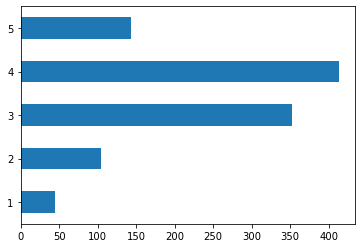

In [31]:
av_rank_bam_score = pd.value_counts(df['bam_score_rank'].values, sort=False)
av_rank_bam_score.plot.barh()

In [32]:
# Observations - A lot of values in 4 and 3 rank - We see a very normal distribution here.
# This one should not make much sense/insight should not be used

## EDA - (5) Wingspan

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



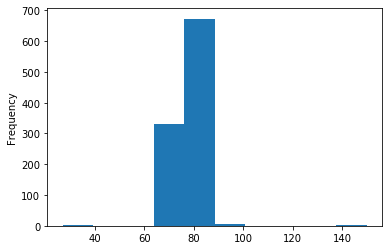

In [33]:
df['Wingspan'].plot('hist')

In [34]:
df['Wingspan'].describe(), 

(count    1012.000000
 mean       78.089797
 std         5.261419
 min        27.000000
 25%        75.500000
 50%        78.000000
 75%        80.500000
 max       150.000000
 Name: Wingspan, dtype: float64,)

In [35]:
wingspan_mu = df['Wingspan'].mean()
wingspan_std = df['Wingspan'].std()

min95 = wingspan_mu-2*wingspan_std
max95 = wingspan_mu+2*wingspan_std


def get_rank_wingspan(wing):
    if wing > wingspan_mu+1*wingspan_std:
        return 5
    if wing > wingspan_mu:
        return 4
    if wing > wingspan_mu - wingspan_std:
        return 3
    if wing > wingspan_mu - 2*wingspan_std:
        return 2
    return 1

In [36]:
df['wingspan_rank'] = df['Wingspan'].apply(get_rank_wingspan)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3


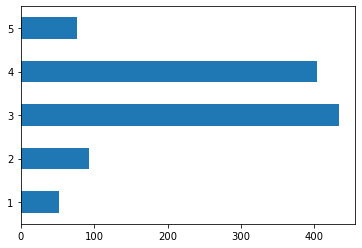

In [37]:
av_rank_wingspan = pd.value_counts(df['wingspan_rank'].values, sort=False)
av_rank_wingspan.plot.barh()

In [38]:
# Observation - Remove Low and high outliers. Data is normal.
# Data makes sense since taller basketball players typically have longer wingspans.

## EDA - (6) Reach

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



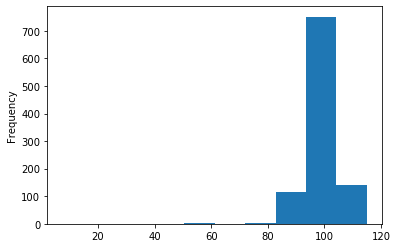

In [39]:
df['Reach'].plot('hist')

In [40]:
df['Reach'].describe(), 

(count    1012.000000
 mean       98.714180
 std         5.958459
 min         7.500000
 25%        95.500000
 50%        99.000000
 75%       102.000000
 max       115.000000
 Name: Reach, dtype: float64,)

In [41]:
reach_mu = df['Reach'].mean()
reach_std = df['Reach'].std()

min95 = reach_mu-2*reach_std
max95 = reach_mu+2*reach_std


def get_rank_reach(reach):
    if reach > reach_mu+1*reach_std:
        return 5
    if reach > reach_mu:
        return 4
    if reach > reach_mu - reach_std:
        return 3
    if reach > reach_mu - 2*reach_std:
        return 2
    return 1

In [42]:
df['reach_rank'] = df['Reach'].apply(get_rank_reach)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4


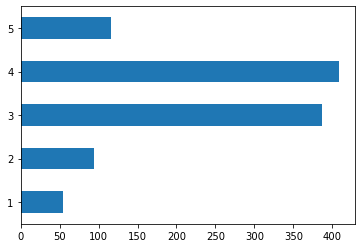

In [43]:
av_rank_reach = pd.value_counts(df['reach_rank'].values, sort=False)
av_rank_reach.plot.barh()

In [44]:
# Observations - Low outliers - very extreme drop in reach between 80-90 and 110-120

## EDA - (7) Height

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



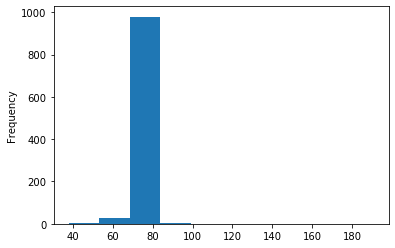

In [45]:
df['Height'].plot('hist')

In [46]:
df['Height'].describe(), 

(count    1012.000000
 mean       75.094195
 std         5.246045
 min        37.875000
 25%        72.500000
 50%        75.000000
 75%        77.500000
 max       190.700000
 Name: Height, dtype: float64,)

In [47]:
height_mu = df['Height'].mean()
height_std = df['Height'].std()

min95 = height_mu-2*height_std
max95 = height_mu+2*height_std


def get_rank_height(height):
    if height > height_mu+1*height_std:
        return 5
    if height > height_mu:
        return 4
    if height > height_mu - height_std:
        return 3
    if height > height_mu - 2*height_std:
        return 2
    return 1

In [48]:
df['height_rank'] = df['Height'].apply(get_rank_height)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4,4
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4,3
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4,4


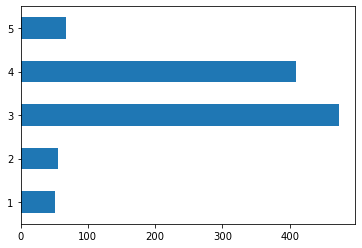

In [49]:
av_rank_height = pd.value_counts(df['height_rank'].values, sort=False)
av_rank_height.plot.barh()

In [50]:
# Observations - Height makes sense. More people are taller.

## EDA - (8) Weight

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



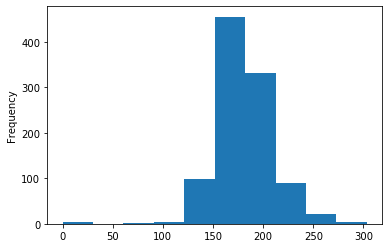

In [51]:
df['Weight'].plot('hist')

In [52]:
df['Weight'].describe(), 

(count    1012.000000
 mean      180.735820
 std        28.646001
 min         0.000000
 25%       164.475000
 50%       178.400000
 75%       196.000000
 max       303.400000
 Name: Weight, dtype: float64,)

In [53]:
weight_mu = df['Weight'].mean()
weight_std = df['Weight'].std()

min95 = weight_mu-2*weight_std
max95 = weight_mu+2*weight_std


def get_rank_weight(weight):
    if weight > weight_mu+1*weight_std:
        return 5
    if weight > weight_mu:
        return 4
    if weight > weight_mu - weight_std:
        return 3
    if weight > weight_mu - 2*weight_std:
        return 2
    return 1

In [54]:
df['weight_rank'] = df['Weight'].apply(get_rank_weight)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3,3,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4,4,4
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4,3,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4,4,3


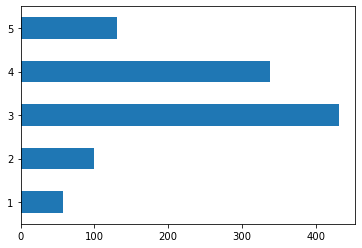

In [55]:
av_rank_weight = pd.value_counts(df['weight_rank'].values, sort=False)
av_rank_weight.plot.barh()

In [56]:
# Observations - Removed low outliers. A lot of people in rank 3 that weight 150-180

## EDA - (9) Body Comp

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



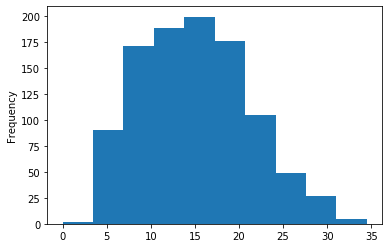

In [57]:
df['Body Comp'].plot('hist')

In [58]:
df['Body Comp'].describe(), 

(count    1012.000000
 mean       14.979496
 std         6.191147
 min         0.000000
 25%        10.200000
 50%        14.700000
 75%        19.200000
 max        34.500000
 Name: Body Comp, dtype: float64,)

In [59]:
body_comp_mu = df['Body Comp'].mean()
body_comp_std = df['Body Comp'].std()

min95 = body_comp_mu-2*body_comp_std
max95 = body_comp_mu+2*body_comp_std


def get_rank_body_comp(body):
    if body > body_comp_mu+1*wingspan_std:
        return 5
    if body > body_comp_mu:
        return 4
    if body > body_comp_mu - body_comp_std:
        return 3
    if body > body_comp_mu - 2*body_comp_std:
        return 2
    return 1

In [60]:
df['body_comp_rank'] = df['Body Comp'].apply(get_rank_body_comp)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3,3,3,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4,4,4,5
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4,3,4,3
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4,4,4,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4,4,3,4


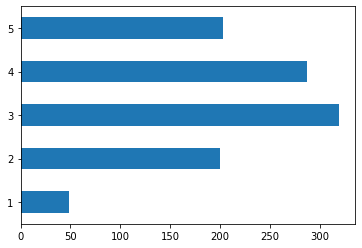

In [61]:
av_rank_body_comp = pd.value_counts(df['body_comp_rank'].values, sort=False)
av_rank_body_comp.plot.barh()

In [62]:
# Observations - Looks normal, small number of people that have a low body comp.
# Interesting because it's hard and not always accurate measuring body comp.

## EDA - (10) Hand Width

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



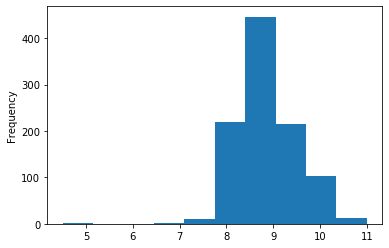

In [63]:
df['Hand Width'].plot('hist')

In [64]:
df['Hand Width'].describe(), 

(count    1009.000000
 mean        8.876189
 std         0.654095
 min         4.500000
 25%         8.500000
 50%         9.000000
 75%         9.250000
 max        11.000000
 Name: Hand Width, dtype: float64,)

In [65]:
hand_width_mu = df['Hand Width'].mean()
hand_width_std = df['Hand Width'].std()

min95 = hand_width_mu-2*hand_width_std
max95 = hand_width_mu+2*hand_width_std


def get_rank_hand_width(handwidth):
    if handwidth > hand_width_mu+1*hand_width_std:
        return 5
    if handwidth > hand_width_mu:
        return 4
    if handwidth > hand_width_mu - hand_width_std:
        return 3
    if handwidth > hand_width_mu - 2*hand_width_std:
        return 2
    return 1

In [66]:
df['hand_width_rank'] = df['Hand Width'].apply(get_rank_hand_width)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3,3,3,3,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4,4,4,5,3
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4,3,4,3,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4,4,4,3,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4,4,3,4,5


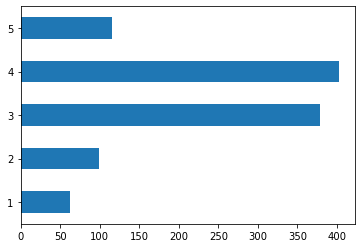

In [67]:
av_rank_hand_width = pd.value_counts(df['hand_width_rank'].values, sort=False)
av_rank_hand_width.plot.barh()

In [68]:
# Remove low outliers - normal.

## Cleaning Data
### Had to clean data for 3/4 Court Sprint and 4-Way Agility to be able to create ranks
### Found empty cells and filled with mean.
### Chose mean rather than median/mode because data is fairly symmetrical/normal, not many outliers, comfortable

## Cleaning - (11) 3/4 Court Sprint

In [69]:
#df['3/4 Court sprint  '] = df['3/4 Court sprint  '].astype(float)

In [70]:
for index,col in enumerate(df['3/4 Court sprint  ']):
    try:
        float(col)
    except ValueError:
        print (index,col)
# Found empty and blank values that we can't convert to a float so we need to clean some more + get rid of spaces/NAN
# float is number value, try and find where they are

371  
377  
391  
417  
616  
653  
879  
968  


In [71]:
df.loc[371, '3/4 Court sprint  ']
# did not come through as float because a space inside a value is actually a string. Not numerical value
# Need float to work w it numerically

' '

In [72]:
df['3/4 Court sprint  '] = df['3/4 Court sprint  '].replace(' ',np.NaN)
df['3/4 Court sprint  ']

0       3.376
1       3.486
2       3.230
3       3.370
4       3.389
        ...  
1054    3.424
1055    3.256
1056      NaN
1057      NaN
1058      NaN
Name: 3/4 Court sprint  , Length: 1059, dtype: float64

In [73]:
x = df.drop(columns=['BAMid', 'BAMScore','bam_score_rank','approach_vertical_rank', 'vertical_jump_rank',
       'reaction_shuttle_rank','wingspan_rank','reach_rank','height_rank','weight_rank','body_comp_rank','hand_width_rank'])
y = df[['bam_score_rank']]

In [74]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 11 columns):
Approach Vertical     986 non-null float64
Vertical Jump         1019 non-null float64
3/4 Court sprint      1018 non-null float64
4-Way agility         1020 non-null object
Reaction Shuttle      1024 non-null float64
Wingspan              1012 non-null float64
Reach                 1012 non-null float64
Height                1012 non-null float64
Weight                1012 non-null float64
Body Comp             1012 non-null float64
Hand Width            1009 non-null float64
dtypes: float64(10), object(1)
memory usage: 91.1+ KB


In [75]:
x = x.replace(to_replace=['Nan','NAN'], value=np.nan)
# Clean + replace Nan if possible
# Fix cell based on caps. Change all to numpy's value of nan (not a number)

In [76]:
x = x.fillna(x.mean())
# FORMULA = df.fillna(df.mean())

In [77]:
x.isnull().sum()
# everything is good except 4 way - it has 39 null values

Approach Vertical      0
Vertical Jump          0
3/4 Court sprint       0
4-Way agility         39
Reaction Shuttle       0
Wingspan               0
Reach                  0
Height                 0
Weight                 0
Body Comp              0
Hand Width             0
dtype: int64

## Cleaning - (12) 4-Way Agility

In [78]:
#df['4-Way agility'] = df['4-Way agility'].astype(float)

In [79]:
for index,col in enumerate(df['4-Way agility']):
    try:
        float(col)
    except ValueError:
        print (index,col)

377  
391  
417  
430  
529  
534  
616  
653  
879  
986  


In [80]:
df.loc[377,'4-Way agility']
# See if it's blank, mispelled, etc. Lazy Data

' '

In [81]:
df['4-Way agility'] = df['4-Way agility'].replace(' ',np.NaN)
df['4-Way agility']

0       11.471
1       12.114
2       12.036
3       12.509
4       12.724
         ...  
1054    12.654
1055    11.136
1056       NaN
1057       NaN
1058       NaN
Name: 4-Way agility, Length: 1059, dtype: float64

In [82]:
x = df.drop(columns=['BAMid', 'BAMScore','bam_score_rank','approach_vertical_rank', 'vertical_jump_rank',
       'reaction_shuttle_rank','wingspan_rank','reach_rank','height_rank','weight_rank','body_comp_rank','hand_width_rank'])
y = df[['bam_score_rank']]

In [83]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 11 columns):
Approach Vertical     986 non-null float64
Vertical Jump         1019 non-null float64
3/4 Court sprint      1018 non-null float64
4-Way agility         1010 non-null float64
Reaction Shuttle      1024 non-null float64
Wingspan              1012 non-null float64
Reach                 1012 non-null float64
Height                1012 non-null float64
Weight                1012 non-null float64
Body Comp             1012 non-null float64
Hand Width            1009 non-null float64
dtypes: float64(11)
memory usage: 91.1 KB


In [84]:
x = x.replace(to_replace=['Nan','NAN'], value=np.nan)

In [85]:
x = x.fillna(x.mean())
# FORMULA = df.fillna(df.mean())

In [86]:
x.isnull().sum()

Approach Vertical     0
Vertical Jump         0
3/4 Court sprint      0
4-Way agility         0
Reaction Shuttle      0
Wingspan              0
Reach                 0
Height                0
Weight                0
Body Comp             0
Hand Width            0
dtype: int64

## EDA (12) - 4-Way agility

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



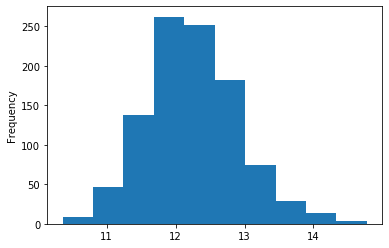

In [87]:
df['4-Way agility'].plot('hist')

In [88]:
df['4-Way agility'].describe(),

(count    1010.000000
 mean       12.247189
 std         0.668387
 min        10.359000
 25%        11.779250
 50%        12.199000
 75%        12.676750
 max        14.775000
 Name: 4-Way agility, dtype: float64,)

In [89]:
fourway_mu = df['4-Way agility'].mean()
fourway_std = df['4-Way agility'].std()

min95 = fourway_mu-2*fourway_std
max95 = fourway_mu+2*fourway_std


def get_rank_fourway(four):
    if four > fourway_mu+1*fourway_std:
        return 5
    if four > fourway_mu:
        return 4
    if four > fourway_mu - fourway_std:
        return 3
    if four > fourway_mu - 2*fourway_std:
        return 2
    return 1

In [90]:
df['fourway_rank'] = df['4-Way agility'].apply(get_rank_fourway)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3,3,3,3,3,2
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4,4,4,5,3,3
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4,3,4,3,4,3
3,1200,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4,4,4,3,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4,4,3,4,5,4


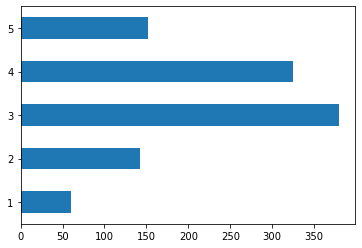

In [91]:
av_rank_counts_fourway = pd.value_counts(df['fourway_rank'].values, sort=False)
av_rank_counts_fourway.plot.barh()

In [92]:
# Observations - Data is extremely normal

## EDA - 3/4 Court Sprint

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='hist')` instead of `Series.plot('hist',)`.



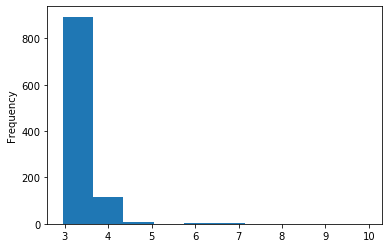

In [93]:
df['3/4 Court sprint  '].plot('hist')

In [94]:
df['3/4 Court sprint  '].describe(),

(count    1018.000000
 mean        3.467047
 std         0.342199
 min         2.950000
 25%         3.335000
 50%         3.419000
 75%         3.545000
 max         9.954000
 Name: 3/4 Court sprint  , dtype: float64,)

In [95]:
courtsprint_mu = df['3/4 Court sprint  '].mean()
courtsprint_std = df['3/4 Court sprint  '].std()

min95 = courtsprint_mu-2*courtsprint_std
max95 = courtsprint_mu+2*courtsprint_std


def get_rank_courtsprint(court):
    if court > courtsprint_mu+1*courtsprint_std:
        return 5
    if court > courtsprint_mu:
        return 4
    if court > courtsprint_mu - courtsprint_std:
        return 3
    if court > courtsprint_mu - 2*courtsprint_std:
        return 2
    return 1

In [96]:
df['courtsprint_rank'] = df['3/4 Court sprint  '].apply(get_rank_courtsprint)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3,3,3,3,3,2,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4,4,4,5,3,3,4
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4,3,4,3,4,3,3
3,1200,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4,4,4,3,4,4,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4,4,3,4,5,4,3


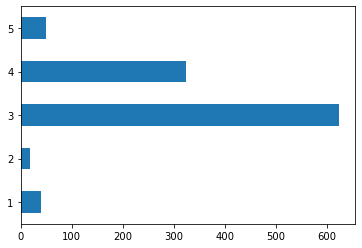

In [97]:
av_rank_counts_courtsprint = pd.value_counts(df['courtsprint_rank'].values, sort=False)
av_rank_counts_courtsprint.plot.barh()

In [98]:
# Observations - Small range of times for 3/4 Court Sprint - but this makes sense.
# Removed outliers

## Data Transformation - Scale

https://towardsdatascience.com/scale-standardize-or-normalize-with-scikit-learn-6ccc7d176a02

## Splitting data into training and testing sets

In [99]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.2, random_state = 0)
# Now we are done cleaning data so we split data into train and test set to see if model works/fits

## Creating Random Forest Regression Model and fitting to training data

In [100]:
scale = maxabs_scale(x, axis=0, copy=True)
print(scale)
# Random Forest Regression - "Random Forest is a Supervised learning algorithm that is based on the ensemble learning method and many Decision Trees. Random Forest is a Bagging technique, so all calculations are run in parallel and there is no interaction between the Decision Trees when building them. RF can be used to solve both Classification and Regression tasks."
# Use Random forest to predict categorical values - I want to classify as ranks so trying randomm forrest first

[[0.77011494 0.75       0.33916014 ... 0.57481872 0.28405797 0.75      ]
 [0.70114943 0.56578947 0.35021097 ... 0.62096243 0.63478261 0.79545455]
 [0.85057471 0.81578947 0.32449267 ... 0.64765985 0.40289855 0.86363636]
 ...
 [0.73171528 0.68053045 0.34830688 ... 0.59570145 0.43418829 0.8069263 ]
 [0.73171528 0.68053045 0.34830688 ... 0.59570145 0.43418829 0.8069263 ]
 [0.73171528 0.68053045 0.34830688 ... 0.59570145 0.43418829 0.8069263 ]]


In [101]:
print(scale.shape)
#1059 rows, 11 columns = feature data set
print(y.shape)
# 1059 rows, 1 column = predictor I am trying to find

(1059, 11)
(1059, 1)


In [102]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 10, random_state = 0)
regressor.fit(scale, y)
# n_estimators = how many times decision tree branches out
# Random state = set random state to duplicate process

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor(n_estimators=10, random_state=0)

In [103]:
regressor.score(scale, y)

0.9628462600196865

## Visualizing Random Forest Regression Results

# Random Forest Classifier

## Created a Random Forest Classifier to figure out the most important features in the model

In [104]:
rf = RandomForestClassifier()
rf.fit (x,y)

#find string in data that is messing it up

/Users/bryanjamieson/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier()

In [105]:
#print(rf.columns)
print(rf.feature_importances_)

[0.12157154 0.10838303 0.15473863 0.17637652 0.18625073 0.03986405
 0.04075684 0.03881121 0.05154763 0.04687316 0.03482665]


# Feature Importance Analysis

In [106]:
# This tells us which feature is the most important for BAM Score.

Text(0, 0.5, 'Feature Importance')

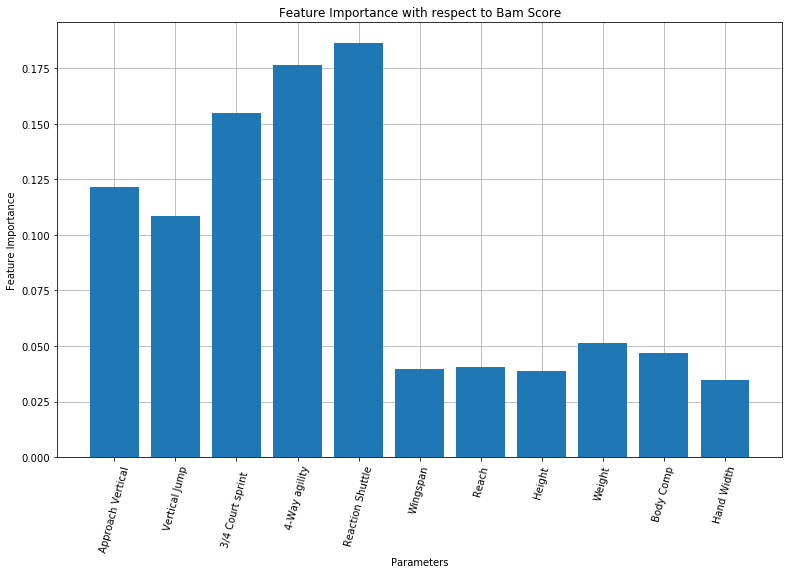

In [107]:
values = rf.feature_importances_
names = x.columns
plt.figure(figsize=(13,8))
plt.grid(zorder=0)
plt.bar(names,values,zorder=2)
plt.xticks(rotation=75)
plt.show

plt.title('Feature Importance with respect to Bam Score')
plt.xlabel('Parameters')
plt.ylabel('Feature Importance')

In [108]:
# Do this again and take out anthros because they are not factored into BAMscore.

In [109]:
df_cleaned = x.copy()

In [110]:
df_cleaned['bam_score'] = y
df_cleaned.head(2)

,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,bam_score
0,33.5,28.5,3.376,11.471,3.669,72.75,94.0,70.0,174.4,9.8,8.25,4
1,30.5,21.5,3.486,12.114,3.355,82.00,104.5,79.5,188.4,21.9,8.75,3


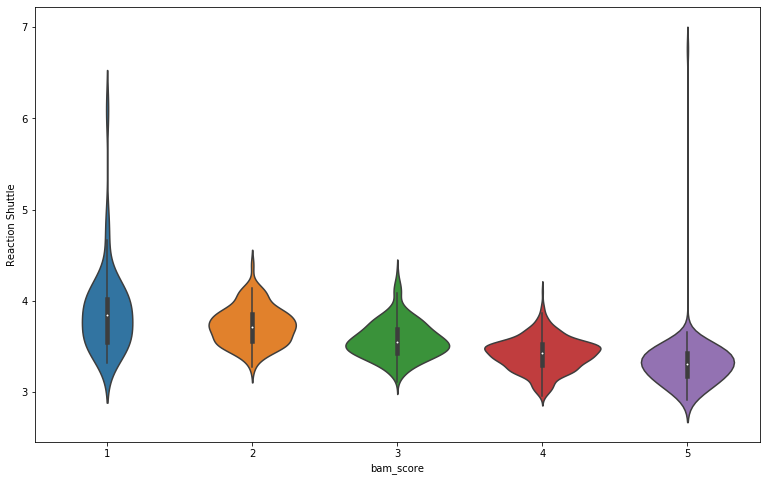

In [111]:
plt.figure(figsize=(13, 8))
sns.violinplot(x='bam_score', y='Reaction Shuttle', data=df_cleaned)
plt.show()

<Figure size 576x360 with 0 Axes>

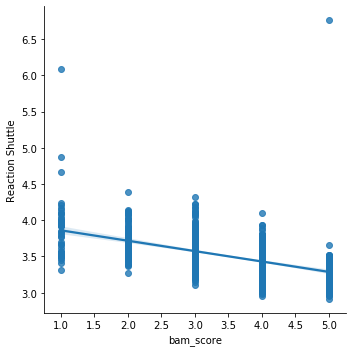

In [112]:
plt.figure(figsize=(8, 5))
sns.lmplot(x='bam_score', y='Reaction Shuttle', data=df_cleaned)
plt.show()

In [113]:
#Observation - reaction shuttle is the highest dilineator for their rank

# Scatter Matrix to visualize trends

In [114]:
ranked_columns = []

for col in df.columns:
    if col.endswith('rank'):
        ranked_columns.append(col)
ranked_columns
# We do scatter matrix to look for multicollinearity. AKA we want swarm of bees graph because
# that means they are not dependant on the other variables.

['approach_vertical_rank',
 'vertical_jump_rank',
 'reaction_shuttle_rank',
 'bam_score_rank',
 'wingspan_rank',
 'reach_rank',
 'height_rank',
 'weight_rank',
 'body_comp_rank',
 'hand_width_rank',
 'fourway_rank',
 'courtsprint_rank']

In [115]:
# Endswith method has to reference a string. Formula is col.endswith('')

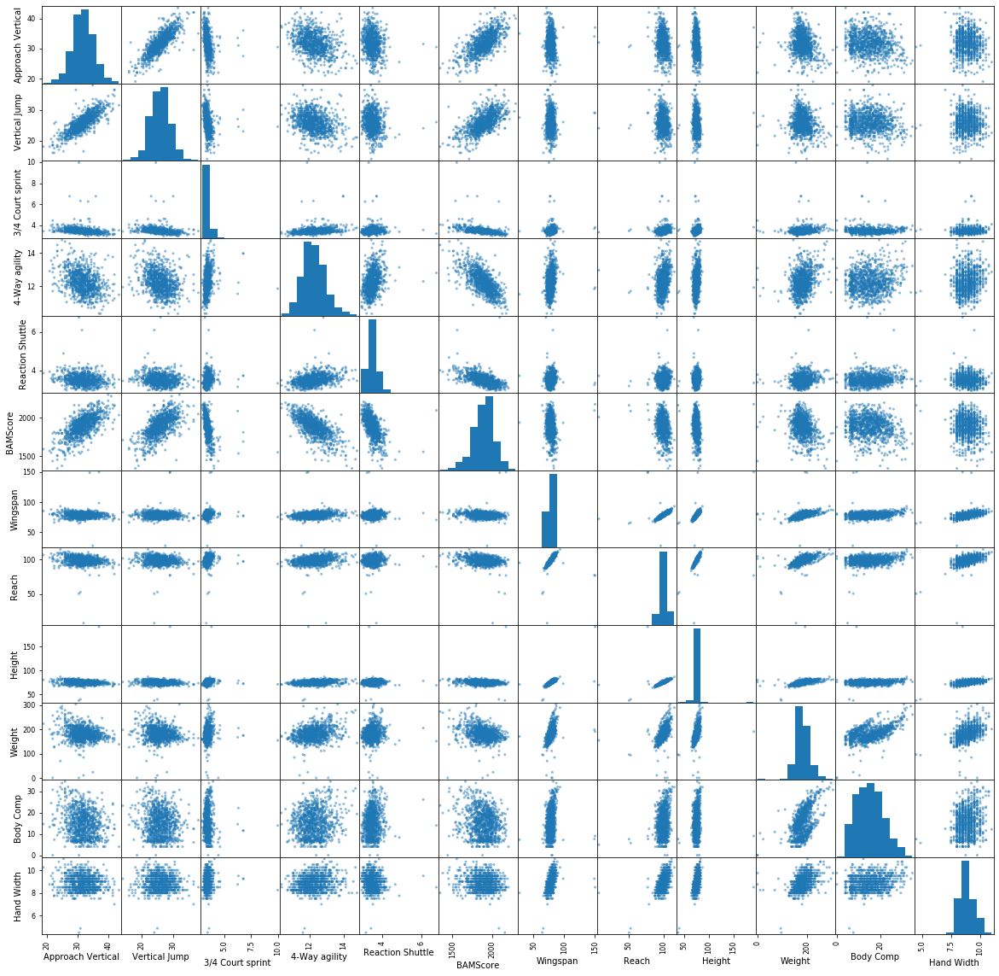

In [116]:
# Make scatter matrix to visualize 
pd.plotting.scatter_matrix(df.drop(columns=ranked_columns), figsize=(20,20))
plt.show()

#df.drop('courtsprint_rank','fourway_rank')
# Looking for multicollinearity which means each feature is dependant on each other

In [117]:
df.to_csv('BAM_Updated.csv',index=False)

# This is what I should import for the next notebook with my analysis

In [118]:
df=pd.read_csv("BAM_Updated.csv")
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3,3,3,3,3,2,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4,4,4,5,3,3,4
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4,3,4,3,4,3,3
3,1200,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4,4,4,3,4,4,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4,4,3,4,5,4,3


## Violin Plots for bam_score_rank with respect to each paramater

### Violin Plot for bam_score_rank with respect to Approach Vertical

In [119]:
## This plot looks weird at:
### bam_score_rank 2, height_rank 2
### bam_score_rank 3, height_rank 2
### bam_score_rank 3, height_rank 1
## But this is ok and correct because there is not much data.

In [120]:
df.loc[(df.bam_score_rank == 5) & (df.height_rank == 2)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
61,339,NaN,30.0,3.1120,11.543,3.405,2048.0,73.0,90.5,69.0,150.0,11.6,8.5,1,5,3,5,3,2,2,2,3,3,2,2
654,1346,30.5,26.0,3.2125,12.807,6.759,2095.0,70.0,90.0,69.5,151.2,13.9,8.5,3,4,5,5,2,2,2,2,3,3,4,3
1055,651,31.5,26.5,3.2560,11.136,3.343,2029.0,74.0,91.5,68.0,172.1,23.4,8.5,3,4,3,5,3,2,2,3,5,3,2,3


In [121]:
fig = px.violin(df, y="Approach Vertical", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

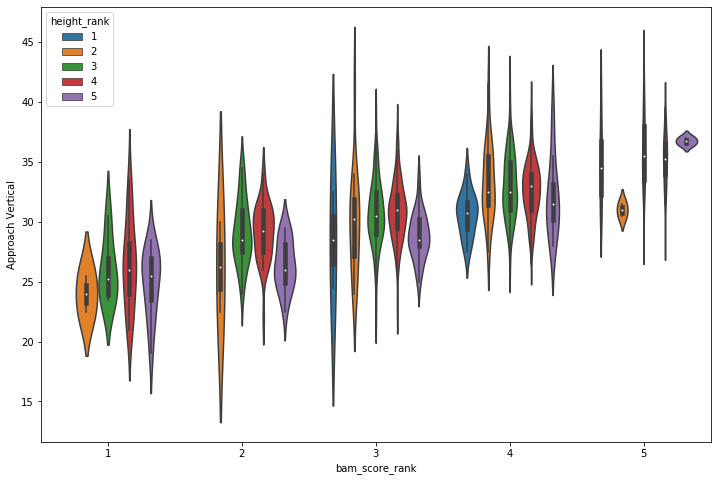

In [122]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Approach Vertical',hue='height_rank',data=df)
plt.show()

In [123]:
#Observation - positive correlation between BAM_SCORE_RANK and approach vertical.
# No correlation between approach vertical and height rank
# People with height 4 always have best approach vertical

### Violin Plot for bam_score_rank with respect to Vertical Jump

In [124]:
fig = px.violin(df, y="Vertical Jump", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

# https://plotly.com/python/violin/

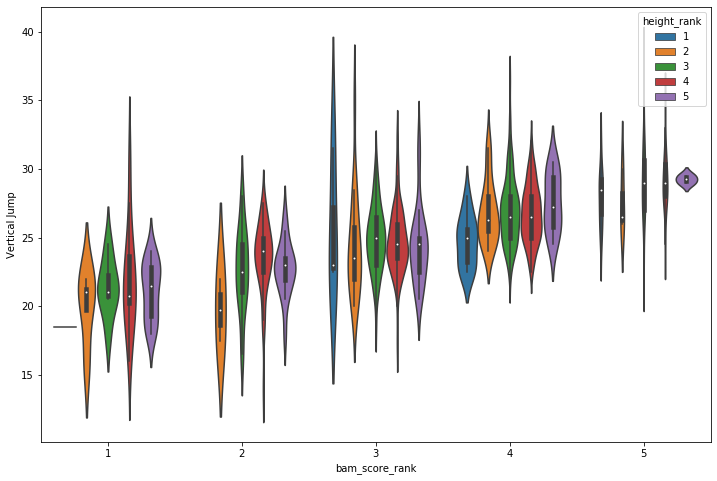

In [125]:
# Violin plot - different style

plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Vertical Jump',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to 3/4 Court sprint

In [126]:
# Use this to find Index that outlier is in and add it to dropped rows
# df.loc[(df.bam_score_rank == 2) & (df.height_rank == 3)]
# Change bam score rank and height rank values to outliers I see in violin plot

In [127]:
df.loc[(df.bam_score_rank == 5) & (df.height_rank == 3)].head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
6,1508,32.0,27.5,3.210,11.276,3.047,2088.0,73.0,92.0,70.00,130.8,11.5,8.00,4,4,2,5,3,2,3,2,3,2,2,3
30,929,32.5,28.0,3.357,11.297,3.213,2043.0,70.0,90.5,70.75,153.6,6.0,NaN,4,4,2,5,2,2,3,3,2,1,2,3
36,1404,36.5,31.0,3.171,11.249,3.113,2139.0,78.0,98.0,73.50,167.0,13.6,9.75,5,5,2,5,3,3,3,3,3,5,2,3
50,1242,35.5,26.5,3.305,11.368,3.241,2048.0,75.5,96.0,72.00,150.0,10.4,8.75,5,4,3,5,3,3,3,2,3,3,2,3
67,985,29.0,22.0,3.388,12.119,3.458,2078.0,78.5,98.0,73.50,150.6,6.3,7.50,3,2,3,5,4,3,3,2,2,1,3,3


In [128]:
# Outliers removed

In [129]:
dropped_rows_court_sprint = [233,511,18,124,971]
fig = px.violin(df.drop(index=dropped_rows_court_sprint), y="3/4 Court sprint  ", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

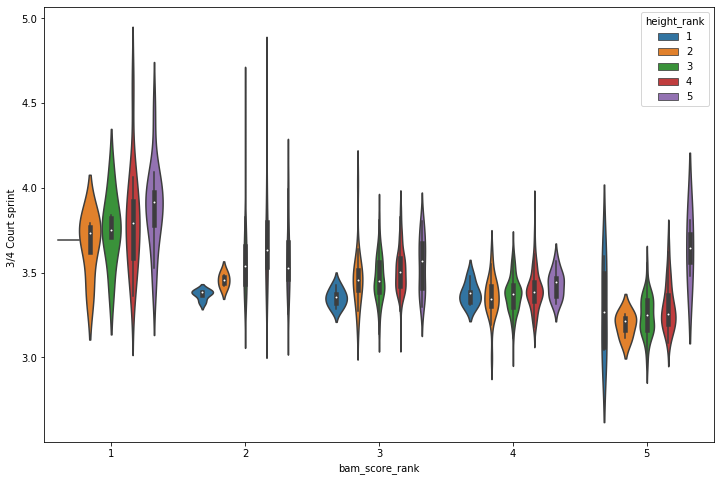

In [130]:
plt.figure(figsize = (12,8))
sns.violinplot(data=df.drop(index=dropped_rows_court_sprint), x='bam_score_rank',
               y='3/4 Court sprint  ',hue='height_rank')
plt.show()

### Violin Plots for bam_score_rank with respect to 4-Way agility

In [131]:
fig = px.violin(df, y="4-Way agility", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

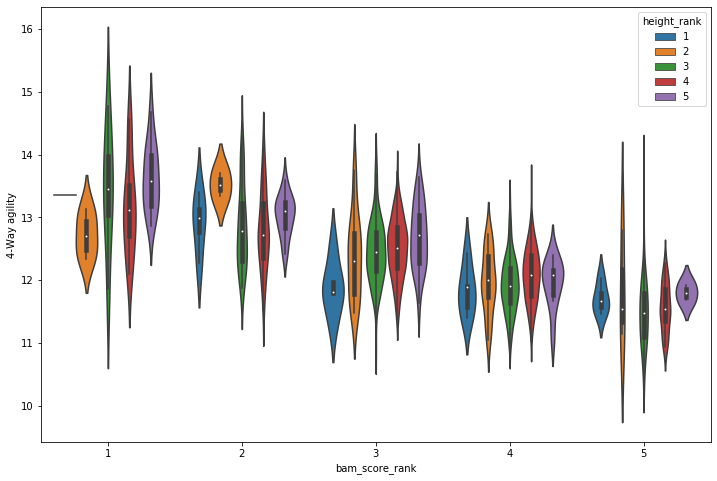

In [132]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='4-Way agility',hue='height_rank',data=df)
plt.show()

In [133]:
# Vnext or drilldown to compare 3's (average) to 5's (bottom)
# What's the drilldown between height and reaction shuttle


### Violin Plots for bam_score_rank with respect to Reaction Shuttle

In [134]:
df.loc[(df.bam_score_rank == 1) & (df.height_rank == 2)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
204,571,22.5,16.0,3.762,12.522,3.552,1608.0,66.00,87.5,67.50,126.0,14.2,7.75,1,1,4,1,1,2,2,2,3,2,4,4
587,316,NaN,21.0,3.703,12.889,3.962,1542.0,76.00,91.0,67.50,161.7,20.6,8.75,1,2,5,1,3,2,2,3,5,3,4,4
634,269,NaN,21.0,3.795,12.340,4.667,1456.0,72.00,93.5,69.50,138.0,8.9,8.75,1,2,5,1,2,3,2,2,3,3,4,4
981,1479,25.5,22.0,3.388,13.134,4.875,1561.0,72.25,92.5,69.75,153.8,8.3,7.75,2,2,5,1,2,2,2,3,2,2,5,3


In [135]:
dropped_rows_reaction_shuttle = [654,744]
fig = px.violin(df.drop(index = dropped_rows_reaction_shuttle), y="Reaction Shuttle", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

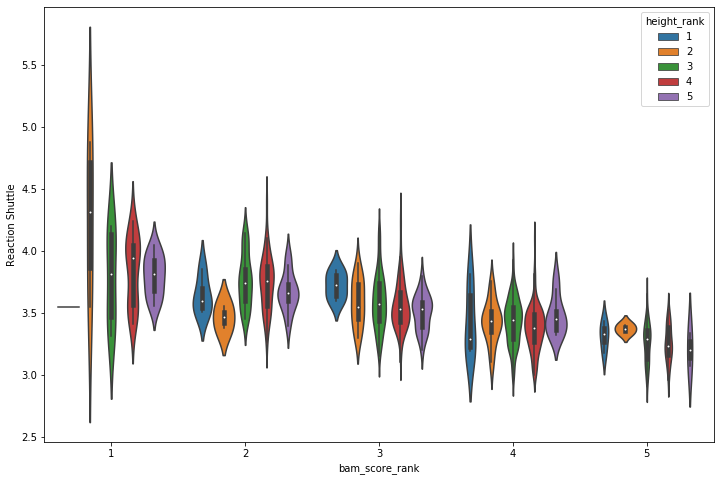

In [136]:
plt.figure(figsize = (12,8))
sns.violinplot(data = df.drop(dropped_rows_reaction_shuttle), x='bam_score_rank', y='Reaction Shuttle',hue='height_rank')
plt.show()

### Violin Plots for bam_score_rank with respect to Wingspan

In [137]:
df.loc[(df.bam_score_rank == 4) & (df.height_rank == 3)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.00,174.4,9.8,8.25,4,4,4,4,2,3,3,3,3,3,2,3
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.00,196.5,13.9,9.50,5,5,4,4,4,4,3,4,3,4,3,3
8,413,NaN,34.0,3.263,12.644,3.498,1932.0,76.00,95.5,73.00,157.3,16.3,8.25,1,5,3,4,3,3,3,3,4,3,4,3
10,1283,NaN,NaN,3.396,11.387,3.384,1922.0,75.00,95.5,73.00,184.5,19.0,8.75,1,1,3,4,3,3,3,4,4,3,2,3
13,1016,35.0,28.0,3.512,12.407,3.619,1894.0,78.50,98.5,74.50,191.4,20.7,8.50,4,4,4,4,4,3,3,4,5,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1021,576,35.5,26.0,3.423,12.289,3.460,1936.0,75.50,97.0,74.50,157.5,4.0,8.00,5,4,3,4,3,3,3,3,2,2,4,3
1026,1044,40.0,31.5,3.425,12.366,3.458,1995.0,76.50,96.0,72.50,169.5,7.0,9.00,5,5,3,4,3,3,3,3,2,4,4,3
1038,1204,NaN,31.0,3.268,11.797,3.476,1976.0,79.00,97.5,73.50,169.2,15.8,8.50,1,5,3,4,4,3,3,3,4,3,3,3
1045,1055,37.0,29.5,3.612,12.122,3.197,1985.0,73.50,95.0,72.25,152.1,6.3,8.50,5,5,2,4,3,3,3,3,2,3,3,4


In [138]:
df.loc[(df.bam_score_rank == 4) & (df.height_rank == 5)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
80,1300,32.0,26.5,3.363,11.110,3.364,2014.0,84.00,106.0,81.0,84.0,20.8,9.25,4,4,3,4,5,5,5,1,5,4,2,3
283,298,33.5,29.0,3.446,11.940,3.696,1913.0,80.00,103.0,81.0,162.5,14.9,8.75,4,5,4,4,4,4,5,3,3,3,3,3
335,828,39.0,30.5,3.470,12.104,3.369,2006.0,81.75,104.5,80.5,181.9,5.8,9.25,5,5,3,4,4,4,5,4,2,4,3,4
446,639,35.5,30.0,3.316,12.165,3.793,1919.0,85.00,107.0,81.0,207.6,17.4,9.75,5,5,5,4,5,5,5,4,4,5,3,3
484,281,30.5,24.5,NaN,11.670,3.518,1910.0,83.00,107.5,80.5,190.6,11.5,9.75,3,3,4,4,4,5,5,4,3,5,3,1
643,1498,31.5,25.5,3.492,12.408,3.325,1899.0,84.50,108.5,80.5,197.0,22.7,10.50,3,3,3,4,5,5,5,4,5,5,4,4
645,1122,31.5,29.5,3.355,12.285,3.446,1945.0,81.50,108.5,81.5,195.0,18.8,10.00,3,5,3,4,4,5,5,4,4,5,4,3
712,981,29.0,27.5,3.469,12.152,3.506,1929.0,84.00,105.0,83.0,196.0,10.3,8.75,3,4,4,4,5,5,5,4,3,3,3,4
961,426,28.0,25.5,3.386,12.060,3.322,1918.0,80.50,105.5,81.0,202.2,8.5,9.00,2,3,3,4,4,5,5,4,2,4,3,3
1051,1336,30.0,27.0,3.569,11.702,3.451,1909.0,83.00,104.0,83.5,213.0,19.1,9.75,3,4,3,4,4,4,5,5,4,5,3,4


In [139]:
dropped_rows_wingspan = [282,489, 578]
fig = px.violin(df.drop(index = dropped_rows_wingspan), y="Wingspan", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

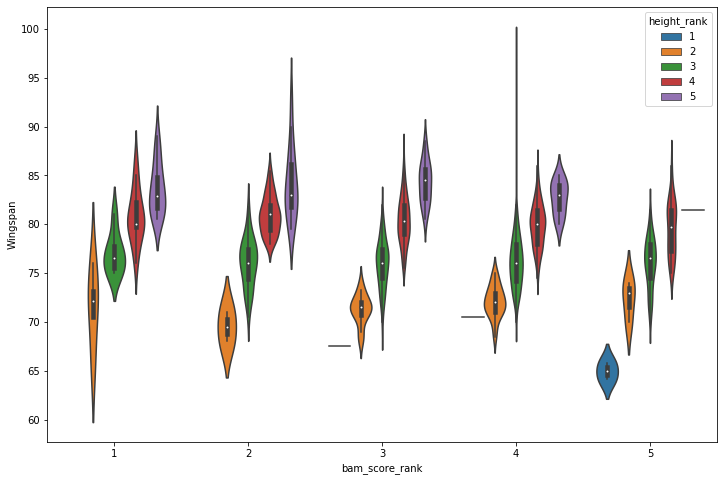

In [140]:
plt.figure(figsize = (12,8))
sns.violinplot(data = df.drop(dropped_rows_wingspan), x='bam_score_rank',
               y='Wingspan',hue='height_rank')
plt.show()

### Violin Plots for bam_score_rank with respect to Reach

In [141]:
df.loc[(df.bam_score_rank == 5) & (df.height_rank == 1) & (df.reach_rank == 1)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
5,490,37.0,29.0,NaN,NaN,NaN,2208.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
143,869,34.5,29.5,NaN,NaN,NaN,2190.0,NaN,NaN,NaN,NaN,NaN,NaN,4,5,1,5,1,1,1,1,1,1,1,1
144,670,34.5,27.0,NaN,NaN,NaN,2140.0,NaN,NaN,NaN,NaN,NaN,NaN,4,4,1,5,1,1,1,1,1,1,1,1
157,787,31.5,25.5,NaN,NaN,NaN,2050.0,NaN,NaN,NaN,NaN,NaN,NaN,3,3,1,5,1,1,1,1,1,1,1,1
212,930,41.0,29.5,NaN,NaN,NaN,2280.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
219,886,30.5,25.5,NaN,NaN,NaN,2030.0,NaN,NaN,NaN,NaN,NaN,NaN,3,3,1,5,1,1,1,1,1,1,1,1
228,348,36.5,27.0,NaN,NaN,NaN,2162.0,NaN,NaN,NaN,NaN,NaN,NaN,5,4,1,5,1,1,1,1,1,1,1,1
340,380,30.5,24.0,3.463,11.615,3.174,2161.0,64.125,50.50,37.875,95.75,7.55,4.500,3,3,2,5,1,1,1,1,2,1,3,3
377,1262,37.0,29.5,NaN,NaN,NaN,2218.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
378,489,31.0,25.0,3.597,11.714,3.433,2086.0,65.750,52.75,40.250,93.35,5.70,4.875,3,3,3,5,1,1,1,1,2,1,3,4


In [142]:
dropped_rows_reach = [490, 340, 378]
fig = px.violin(df.drop(index=dropped_rows_reach), y="Reach", x="bam_score_rank",
                color='height_rank', box=True, hover_data=df.columns)
fig.show()

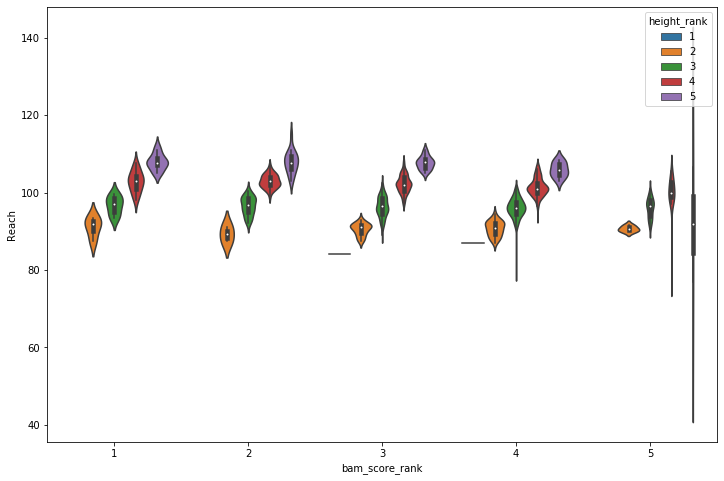

In [143]:
plt.figure(figsize = (12,8))
sns.violinplot(data=df.drop(dropped_rows_reach), x='bam_score_rank', y='Reach',
               hue='height_rank')
plt.show()

### Violin Plots for bam_score_rank with respect to Height

In [144]:
df.loc[(df.bam_score_rank == 5) & (df.height_rank == 1)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
5,490,37.0,29.0,NaN,NaN,NaN,2208.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
143,869,34.5,29.5,NaN,NaN,NaN,2190.0,NaN,NaN,NaN,NaN,NaN,NaN,4,5,1,5,1,1,1,1,1,1,1,1
144,670,34.5,27.0,NaN,NaN,NaN,2140.0,NaN,NaN,NaN,NaN,NaN,NaN,4,4,1,5,1,1,1,1,1,1,1,1
157,787,31.5,25.5,NaN,NaN,NaN,2050.0,NaN,NaN,NaN,NaN,NaN,NaN,3,3,1,5,1,1,1,1,1,1,1,1
212,930,41.0,29.5,NaN,NaN,NaN,2280.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
219,886,30.5,25.5,NaN,NaN,NaN,2030.0,NaN,NaN,NaN,NaN,NaN,NaN,3,3,1,5,1,1,1,1,1,1,1,1
228,348,36.5,27.0,NaN,NaN,NaN,2162.0,NaN,NaN,NaN,NaN,NaN,NaN,5,4,1,5,1,1,1,1,1,1,1,1
340,380,30.5,24.0,3.463,11.615,3.174,2161.0,64.125,50.50,37.875,95.75,7.55,4.500,3,3,2,5,1,1,1,1,2,1,3,3
377,1262,37.0,29.5,NaN,NaN,NaN,2218.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
378,489,31.0,25.0,3.597,11.714,3.433,2086.0,65.750,52.75,40.250,93.35,5.70,4.875,3,3,3,5,1,1,1,1,2,1,3,4


In [145]:
dropped_rows_height = [282, 340, 378]
fig = px.violin(df.drop(index = dropped_rows_height), y="Height", x="bam_score_rank",
                color='height_rank', box=True, hover_data=df.columns)
fig.show()

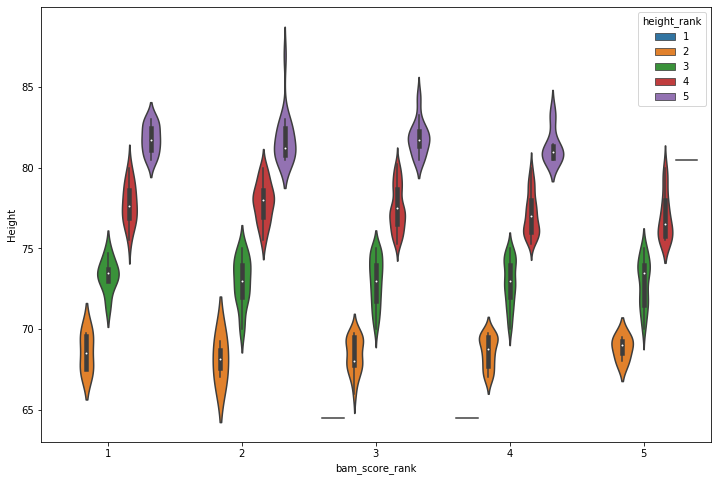

In [146]:
plt.figure(figsize = (12,8))
sns.violinplot(data = df.drop(dropped_rows_height), x='bam_score_rank', 
               y='Height',hue='height_rank')
plt.show()

### Violin Plots for bam_score_rank with respect to Weight

In [147]:
df.loc[(df.bam_score_rank == 4) & (df.height_rank == 5) & (df.weight_rank == 1)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
80,1300,32.0,26.5,3.363,11.11,3.364,2014.0,84.0,106.0,81.0,84.0,20.8,9.25,4,4,3,4,5,5,5,1,5,4,2,3


In [148]:
dropped_rows_weight = [262,106,937,96,905,80]
fig = px.violin(df.drop(index = dropped_rows_weight), y="Weight",x="bam_score_rank",
                color='height_rank',box=True, hover_data=df.columns)
fig.show()

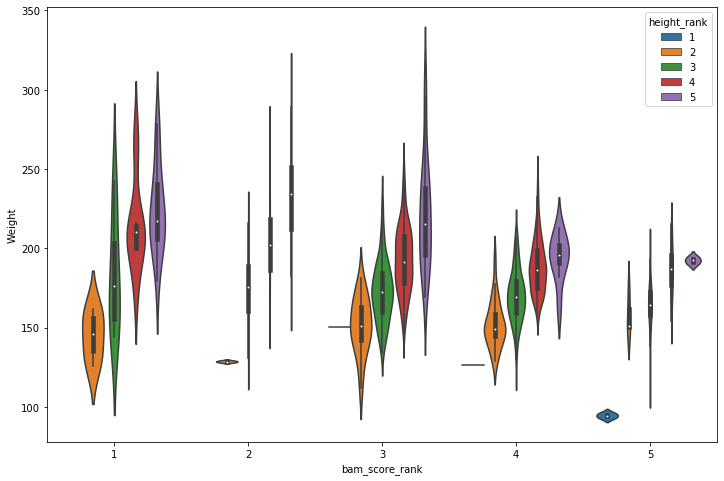

In [149]:
plt.figure(figsize = (12,8))
sns.violinplot(data = df.drop(dropped_rows_weight), x='bam_score_rank',
               y='Weight',hue='height_rank')
plt.show()

### Violin Plots for bam_score_rank with respect to Body Comp

In [150]:
df.loc[(df.bam_score_rank == 2) & (df.height_rank == 5)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
42,1371,26.0,23.5,3.684,13.133,3.631,1728.0,90.00,111.0,83.00,252.0,30.8,9.75,2,3,4,2,5,5,5,5,5,5,5,4
70,1502,24.5,22.0,3.683,12.868,3.534,1710.0,93.00,115.0,87.00,288.9,31.9,10.25,1,2,4,2,5,5,5,5,5,5,4,4
153,1172,29.0,23.0,4.051,13.260,3.441,1666.0,79.50,105.0,81.00,212.9,13.9,8.25,3,3,3,2,4,5,5,5,3,3,5,5
182,1409,24.0,21.5,3.612,13.191,3.637,1667.0,84.00,109.5,82.50,253.0,27.9,10.75,1,2,4,2,5,5,5,5,5,5,5,4
184,776,28.5,24.5,3.255,13.212,3.885,1747.0,86.25,110.0,82.75,248.0,26.6,10.00,3,3,5,2,5,5,5,5,5,5,5,3
221,675,24.5,18.0,3.386,13.281,3.675,1665.0,82.50,110.0,82.00,243.4,15.2,9.00,1,1,4,2,4,5,5,5,4,4,5,3
399,1454,27.5,23.0,3.602,13.461,3.704,1687.0,83.00,107.5,81.25,217.0,12.8,8.75,2,3,4,2,4,5,5,5,3,3,5,4
413,331,26.0,23.5,3.475,13.148,3.591,1746.0,83.00,107.5,80.50,261.4,18.7,9.00,2,3,4,2,4,5,5,5,4,4,5,4
480,336,NaN,NaN,3.465,12.445,3.548,1748.0,80.00,103.0,82.00,199.1,24.2,8.50,1,1,4,2,4,4,5,4,5,3,4,3
527,217,29.5,23.0,3.672,12.684,3.939,1684.0,79.50,103.5,80.50,230.2,13.3,9.00,3,3,5,2,4,4,5,5,3,4,4,4


In [151]:
dropped_rows_body_comp = [262]
fig = px.violin(df.drop(index = dropped_rows_body_comp), y="Body Comp",
                x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

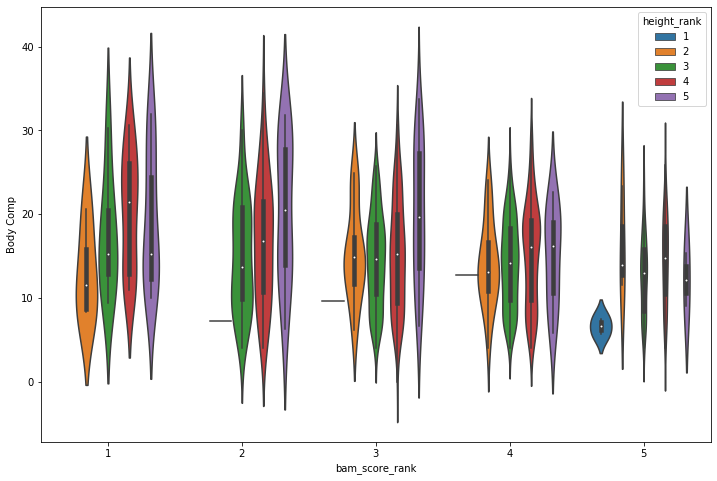

In [152]:
plt.figure(figsize = (12,8))
sns.violinplot(data=df.drop(dropped_rows_body_comp), x='bam_score_rank', 
               y='Body Comp',hue='height_rank')
plt.show()

### Violin Plots for bam_score_rank with respect to Hand Width

In [153]:
# Want to cut off anything below 6.5
# I know this by looking at the normal distribution

In [154]:
df.loc[(df.bam_score_rank == 5) & (df.height_rank == 1)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
5,490,37.0,29.0,NaN,NaN,NaN,2208.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
143,869,34.5,29.5,NaN,NaN,NaN,2190.0,NaN,NaN,NaN,NaN,NaN,NaN,4,5,1,5,1,1,1,1,1,1,1,1
144,670,34.5,27.0,NaN,NaN,NaN,2140.0,NaN,NaN,NaN,NaN,NaN,NaN,4,4,1,5,1,1,1,1,1,1,1,1
157,787,31.5,25.5,NaN,NaN,NaN,2050.0,NaN,NaN,NaN,NaN,NaN,NaN,3,3,1,5,1,1,1,1,1,1,1,1
212,930,41.0,29.5,NaN,NaN,NaN,2280.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
219,886,30.5,25.5,NaN,NaN,NaN,2030.0,NaN,NaN,NaN,NaN,NaN,NaN,3,3,1,5,1,1,1,1,1,1,1,1
228,348,36.5,27.0,NaN,NaN,NaN,2162.0,NaN,NaN,NaN,NaN,NaN,NaN,5,4,1,5,1,1,1,1,1,1,1,1
340,380,30.5,24.0,3.463,11.615,3.174,2161.0,64.125,50.50,37.875,95.75,7.55,4.500,3,3,2,5,1,1,1,1,2,1,3,3
377,1262,37.0,29.5,NaN,NaN,NaN,2218.0,NaN,NaN,NaN,NaN,NaN,NaN,5,5,1,5,1,1,1,1,1,1,1,1
378,489,31.0,25.0,3.597,11.714,3.433,2086.0,65.750,52.75,40.250,93.35,5.70,4.875,3,3,3,5,1,1,1,1,2,1,3,4


In [155]:
dropped_rows_hand_width = [340,378]
fig = px.violin(df.drop(index = dropped_rows_hand_width), y="Hand Width", 
                x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

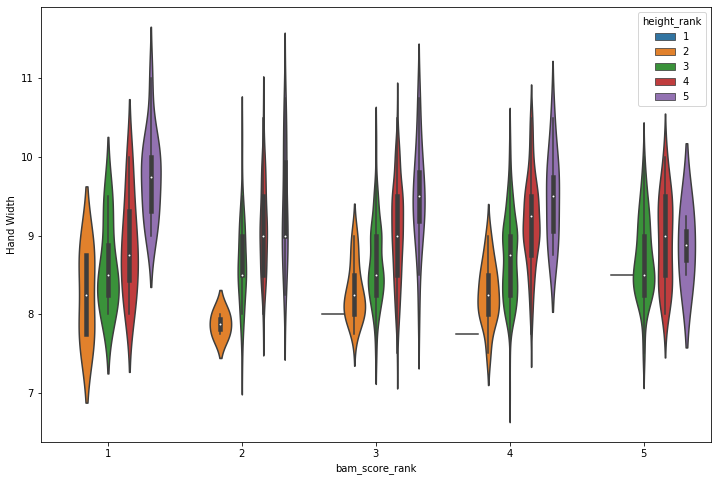

In [156]:
plt.figure(figsize = (12,8))
sns.violinplot(data = df.drop(dropped_rows_hand_width), x='bam_score_rank', 
               y='Hand Width',hue='height_rank')
plt.show()

## Jarque-Bera Test for each parameter
## Ran Jarque-Bera Test for each paramater
### Jarque-Bera test is a goodness-of-fit test thats tests whether the sample data has a skewness and kurtosis matching a normal distribution

In [157]:
# Reaction Shuttle threshold identifier
#skewness = leaning data to one side #kurtosis = normal distribution

In [158]:
rs_mu = df['Reaction Shuttle'].mean()
rs_std = df['Reaction Shuttle'].std()
print(rs_mu, rs_std)
lower_95 = rs_mu-2*rs_std
df.shape, df[df['Reaction Shuttle']>4.5].shape
#3.505 = mean, 0.278 = std|

3.5052431640624997 0.2784274343866079


((1059, 25), (4, 25))

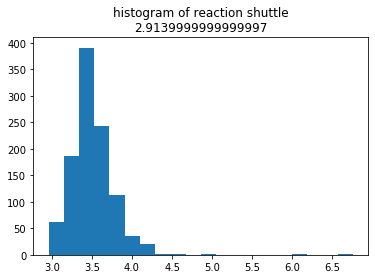

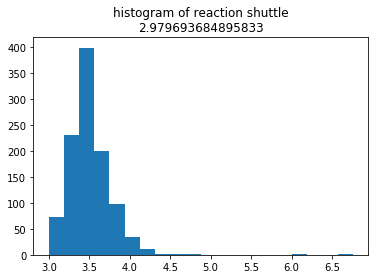

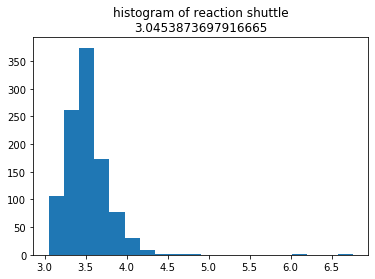

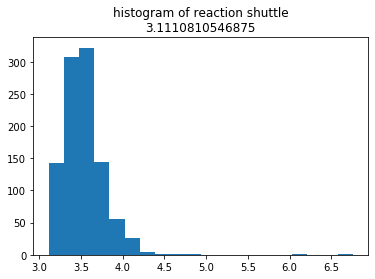

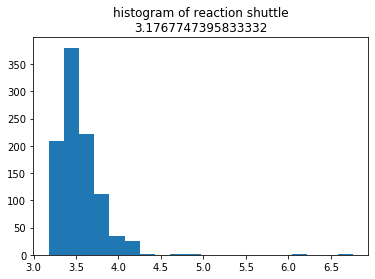

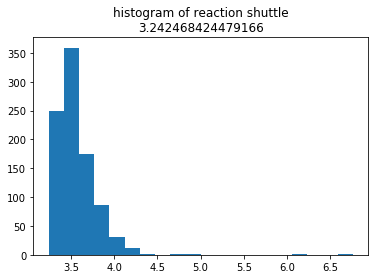

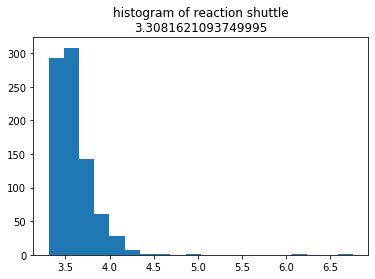

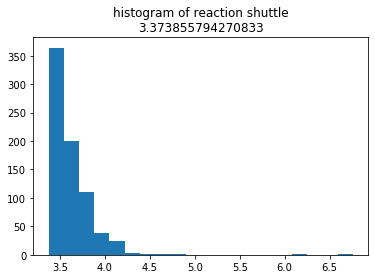

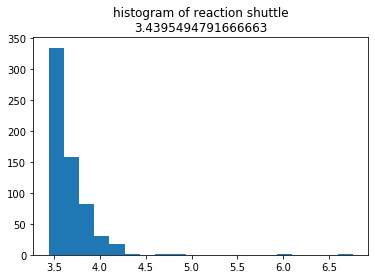

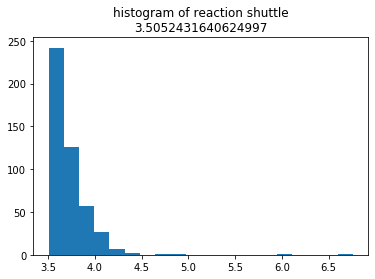

In [159]:
#testing the effectiveness of our model
# if data close to 0, data is normally distrubuted, if close to 1, skewness
rs_min = df['Reaction Shuttle'].min()

jbs = []
thresholds = np.linspace(rs_min, rs_mu, 10)
for threshold in thresholds:
    vals = df[df['Reaction Shuttle'].fillna(rs_mu)>threshold]['Reaction Shuttle'].fillna(rs_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of reaction shuttle\n{}".format(threshold))
    plt.show()
    jb = scs.jarque_bera(vals)
    jbs.append(jb[0])

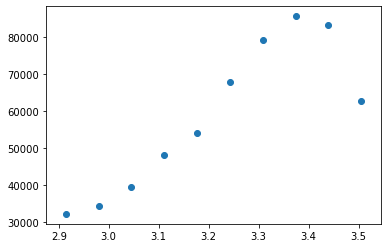

In [160]:
plt.scatter(thresholds, jbs)

In [161]:
# Conclusion - 2.914 threshold

In [162]:
# Threshold Identifier App Vert

In [163]:
av_mu = df['Approach Vertical'].mean()
av_std = df['Approach Vertical'].std()
print(av_mu, av_std)
lower_95 = av_mu-2*av_std
df.shape, df[df['Approach Vertical']>42].shape

31.829614604462474 3.5479850939588244


((1059, 25), (1, 25))

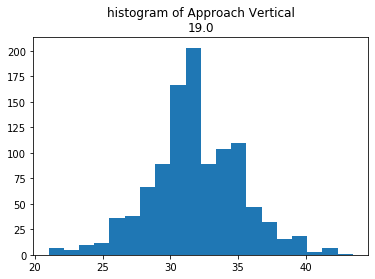

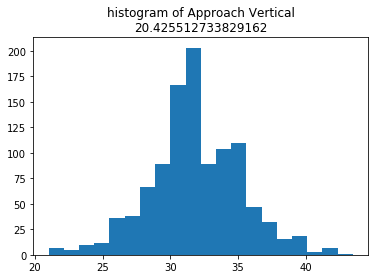

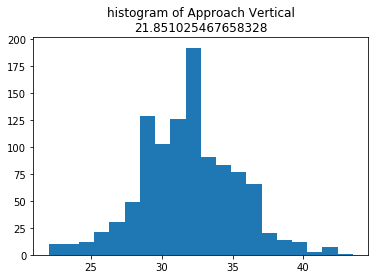

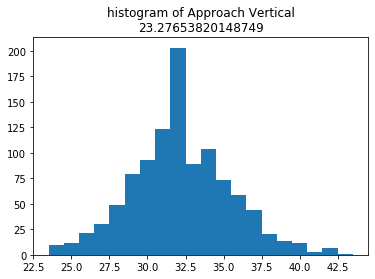

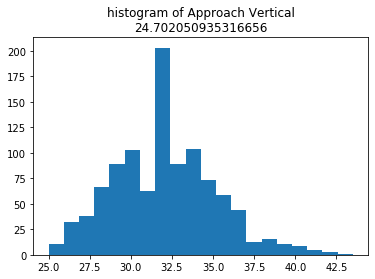

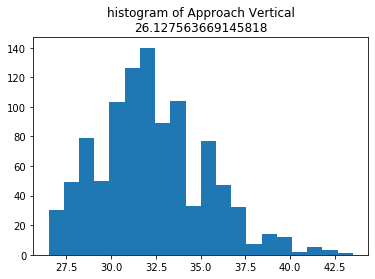

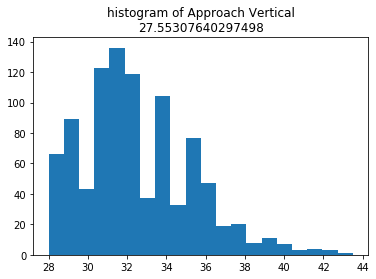

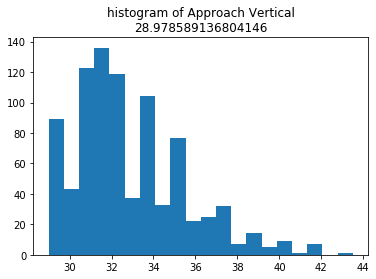

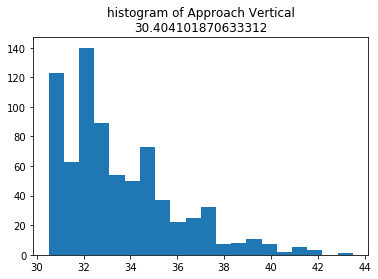

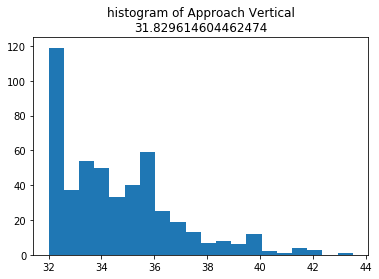

In [164]:
av_min = df['Approach Vertical'].min()

jbs_1 = []
thresholds = np.linspace(av_min, av_mu, 10)
for threshold in thresholds:
    vals = df[df['Approach Vertical'].fillna(av_mu)>threshold]['Approach Vertical'].fillna(av_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Approach Vertical\n{}".format(threshold))
    plt.show()
    jb_1=scs.jarque_bera(vals)
    jbs_1.append(jb_1[0])

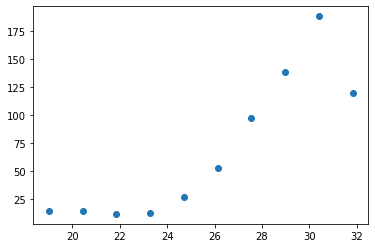

In [165]:
plt.scatter(thresholds, jbs_1)

In [166]:
# 3 Vertical Jump

In [167]:
vj_mu = df['Vertical Jump'].mean()
vj_std = df['Vertical Jump'].std()
print(vj_mu, vj_std)
lower_95 = vj_mu-2*vj_std
df.shape, df[df['Vertical Jump']>38].shape

25.860157016683022 3.1253011446061882


((1059, 25), (0, 25))

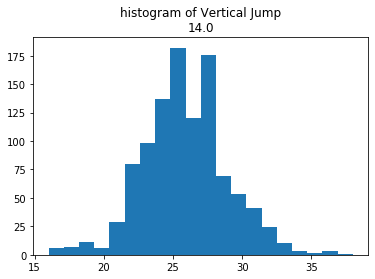

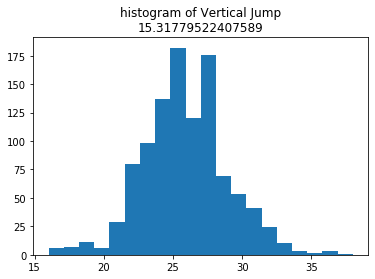

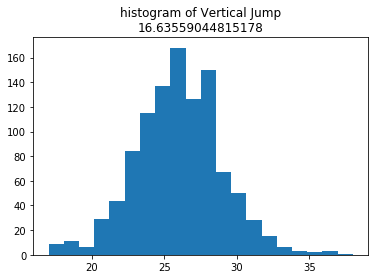

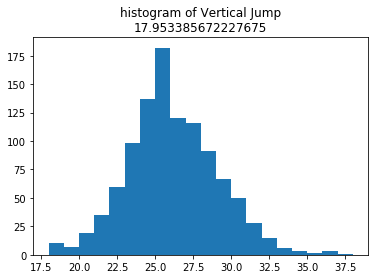

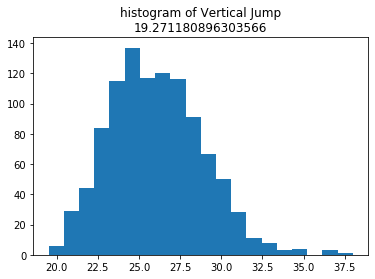

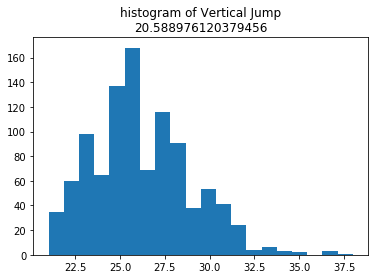

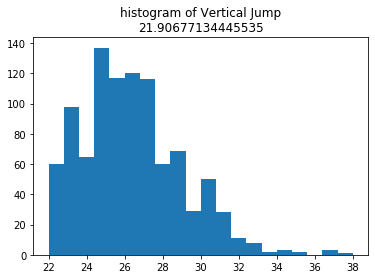

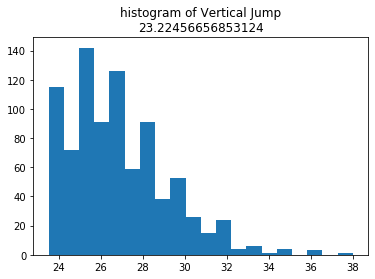

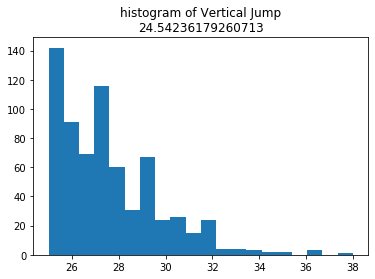

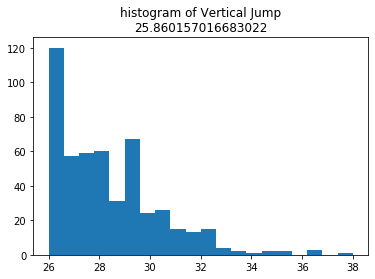

In [168]:
vj_min = df['Vertical Jump'].min()

jbs_2 = []
thresholds = np.linspace(vj_min, vj_mu, 10)
for threshold in thresholds:
    vals = df[df['Vertical Jump'].fillna(vj_mu)>threshold]['Vertical Jump'].fillna(vj_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Vertical Jump\n{}".format(threshold))
    plt.show()
    jb_2=scs.jarque_bera(vals)
    jbs_2.append(jb_2[0])

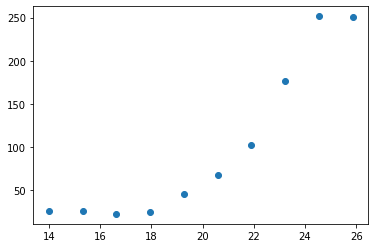

In [169]:
plt.scatter(thresholds, jbs_2)

In [170]:
# 4 3/4 court sprint

In [171]:
cs_mu = df['3/4 Court sprint  '].mean()
cs_std = df['3/4 Court sprint  '].std()
print(cs_mu, cs_std)
lower_95 = cs_mu-2*cs_std
df.shape, df[df['3/4 Court sprint  ']>5].shape

3.4670466601178784 0.3421985054646302


((1059, 25), (5, 25))

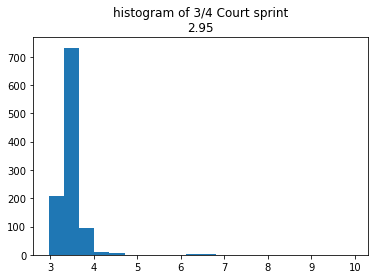

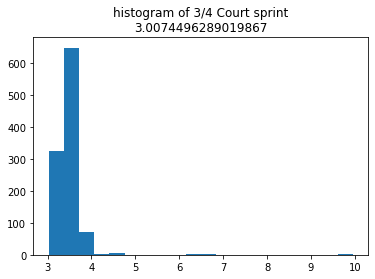

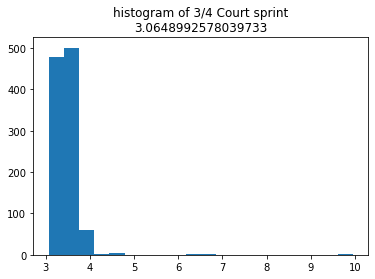

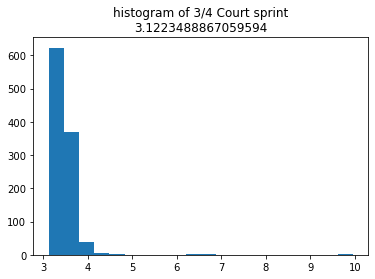

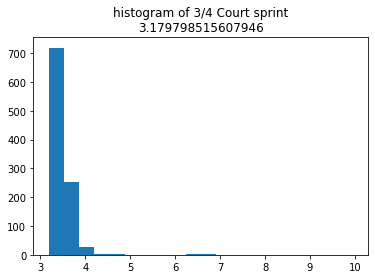

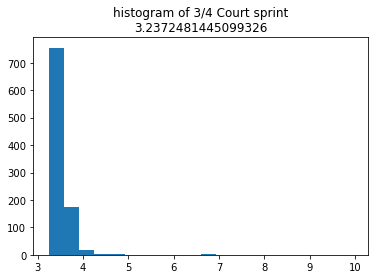

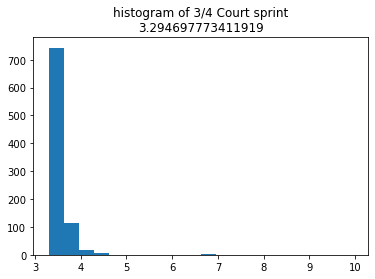

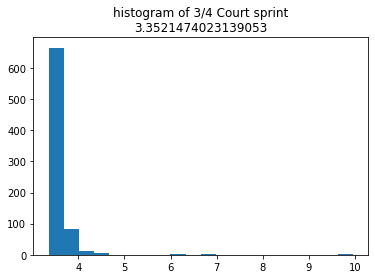

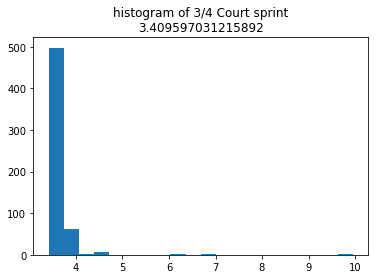

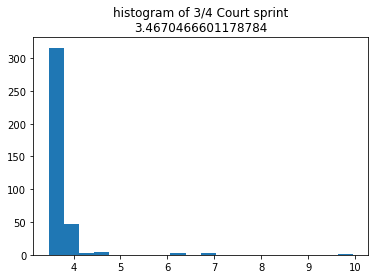

In [172]:
cs_min = df['3/4 Court sprint  '].min()

jbs_3 = []
thresholds = np.linspace(cs_min, cs_mu, 10)
for threshold in thresholds:
    vals = df[df['3/4 Court sprint  '].fillna(cs_mu)>threshold]['3/4 Court sprint  '].fillna(cs_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of 3/4 Court sprint\n{}".format(threshold))
    plt.show()
    jb_3=scs.jarque_bera(vals)
    jbs_3.append(jb_3[0])

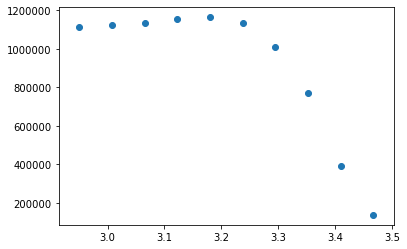

In [173]:
plt.scatter(thresholds, jbs_3)

In [174]:
# 5 4 way agility

In [175]:
wa_mu = df['4-Way agility'].mean()
wa_std = df['4-Way agility'].std()
print(wa_mu, wa_std)
lower_95 = wa_mu-2*wa_std
df.shape, df[df['4-Way agility']>14.25].shape

12.247189108910884 0.6683873176702257


((1059, 25), (5, 25))

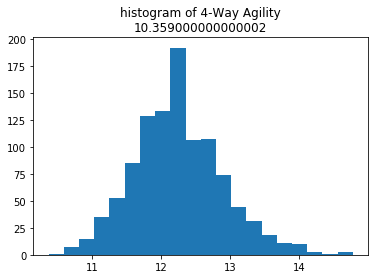

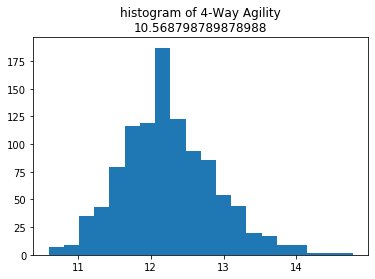

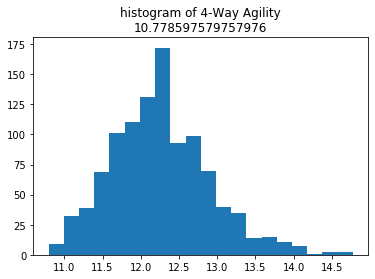

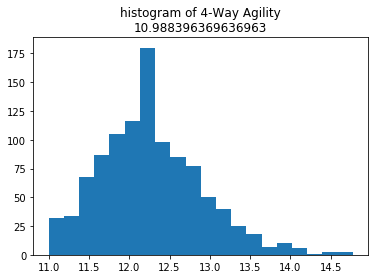

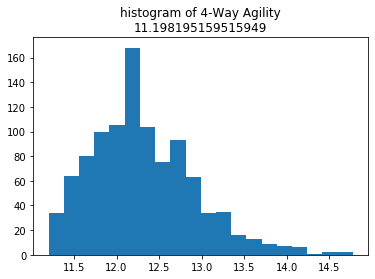

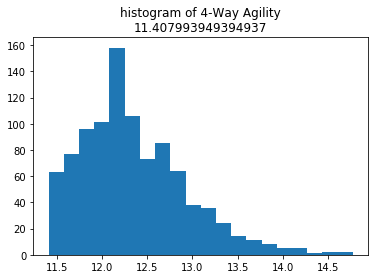

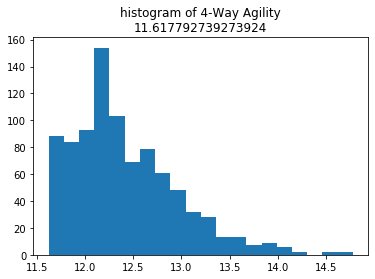

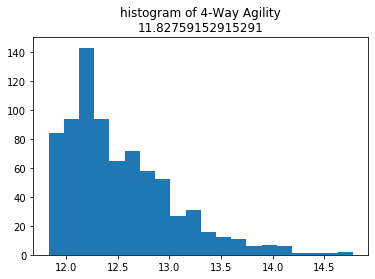

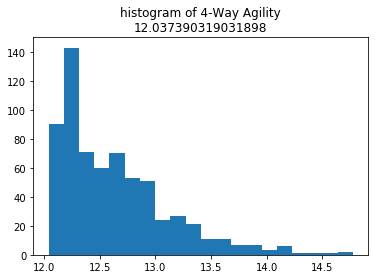

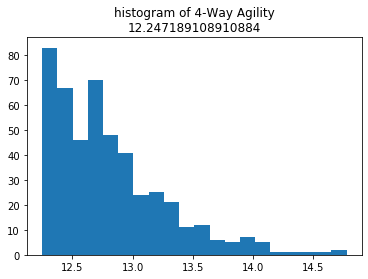

In [176]:
wa_min = df['4-Way agility'].min()

jbs_4 = []
thresholds = np.linspace(wa_min, wa_mu, 10)
for threshold in thresholds:
    vals = df[df['4-Way agility'].fillna(wa_mu)>threshold]['4-Way agility'].fillna(wa_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of 4-Way Agility\n{}".format(threshold))
    plt.show()
    jb_4=scs.jarque_bera(vals)
    jbs_4.append(jb_4[0])

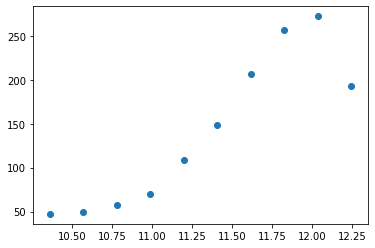

In [177]:
plt.scatter(thresholds, jbs_4)

In [178]:
#6 Wingspan

In [179]:
ws_mu = df['Wingspan'].mean()
ws_std = df['Wingspan'].std()
print(ws_mu, ws_std)
lower_95 = ws_mu-2*ws_std
df.shape, df[df['Wingspan']>100].shape

78.08979743083005 5.261419475728766


((1059, 25), (2, 25))

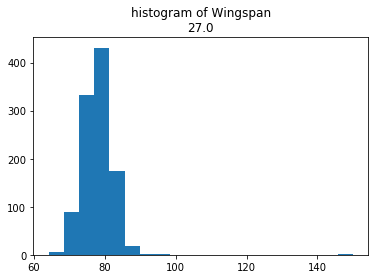

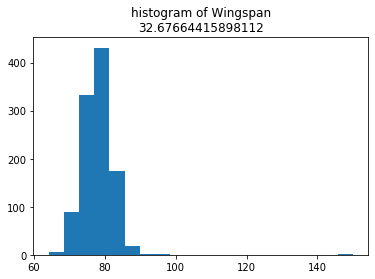

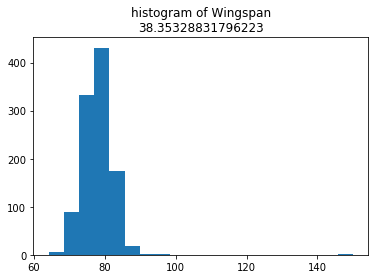

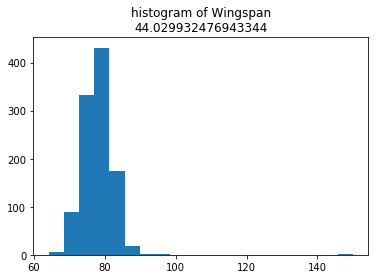

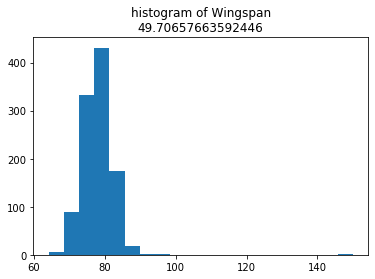

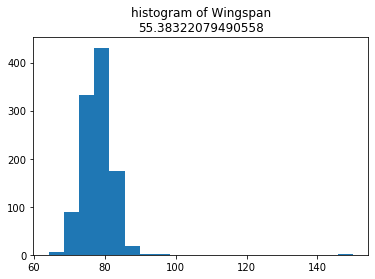

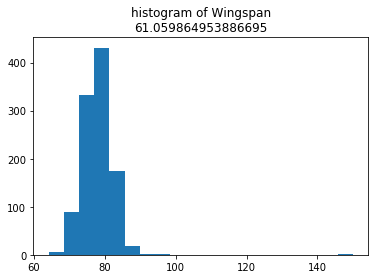

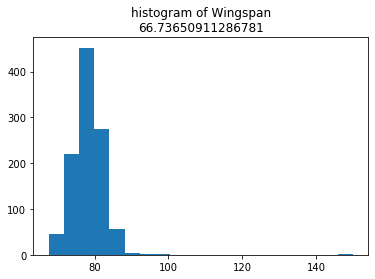

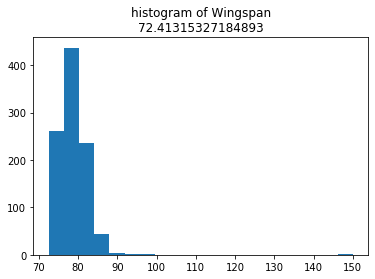

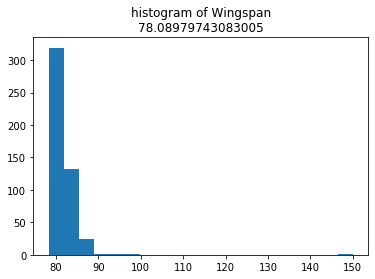

In [180]:
ws_min = df['Wingspan'].min()

jbs_5 = []
thresholds = np.linspace(ws_min, ws_mu, 10)
for threshold in thresholds:
    vals = df[df['Wingspan'].fillna(ws_mu)>threshold]['Wingspan'].fillna(ws_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Wingspan\n{}".format(threshold))
    plt.show()
    jb_5=scs.jarque_bera(vals)
    jbs_5.append(jb_5[0])

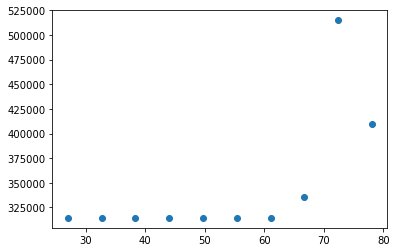

In [181]:
plt.scatter(thresholds, jbs_5)

In [182]:
#7 Reach

In [183]:
((df['Reach']>80)& (df['Reach']<115)).head()

0    True
1    True
2    True
3    True
4    True
Name: Reach, dtype: bool

In [184]:
re_mu = df['Reach'].mean()
re_std = df['Reach'].std()
print(re_mu, re_std)
lower_95 = re_mu-2*re_std
df.shape, df.loc[(df['Reach']>80) & (df['Reach']<115)].shape

98.71417984189723 5.95845856792728


((1059, 25), (1005, 25))

In [185]:
df.loc[df['Reach']>80]


# example of using .loc 

# df.loc[(df['Reach'] > 80) & (df['Reach'] < 115) & (df['Wingspan'] > 75)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.00,174.4,9.8,8.25,4,4,4,4,2,3,3,3,3,3,2,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.50,188.4,21.9,8.75,3,2,3,3,4,4,4,4,5,3,3,4
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.00,196.5,13.9,9.50,5,5,4,4,4,4,3,4,3,4,3,3
3,1200,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.50,205.0,10.6,9.25,3,3,2,4,4,4,4,4,3,4,4,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.00,180.0,15.4,10.00,3,4,3,4,3,4,4,3,4,5,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1051,1336,30.0,27.0,3.569,11.702,3.451,1909.0,83.00,104.0,83.50,213.0,19.1,9.75,3,4,3,4,4,4,5,5,4,5,3,4
1052,1275,30.5,30.5,3.327,12.053,3.333,1981.0,72.50,94.5,72.50,159.0,15.5,8.50,3,5,3,4,2,3,3,3,4,3,3,3
1053,726,30.5,22.0,3.512,12.484,3.434,1828.0,80.00,103.0,76.00,202.8,11.5,10.00,3,2,3,3,4,4,4,4,3,5,4,4
1054,574,36.0,31.0,3.424,12.654,3.635,1917.0,72.00,88.0,68.25,147.4,7.9,8.50,5,5,4,4,2,2,2,2,2,3,4,3


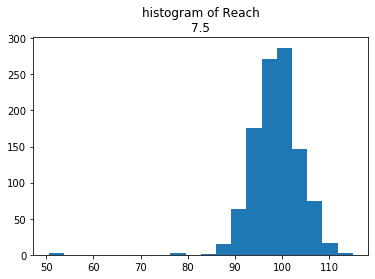

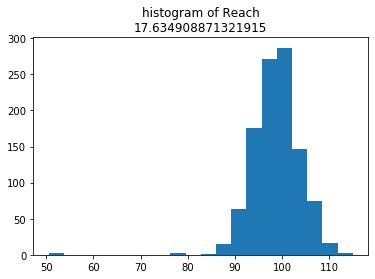

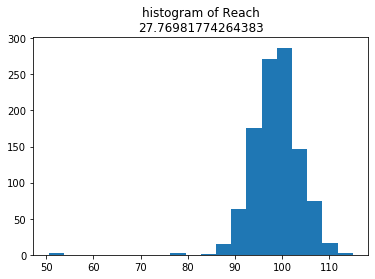

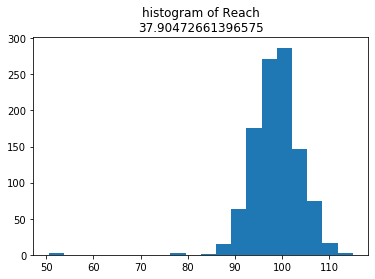

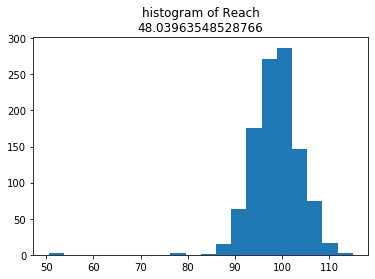

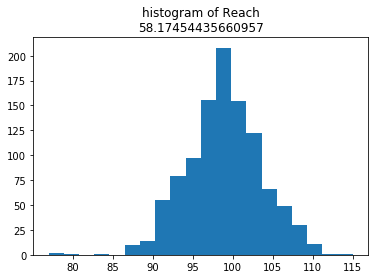

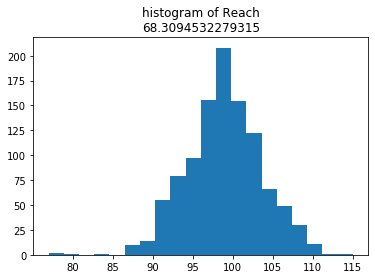

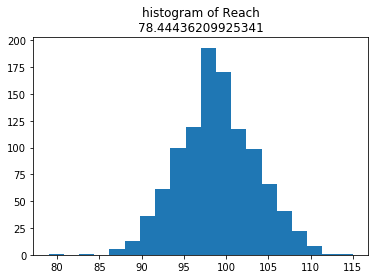

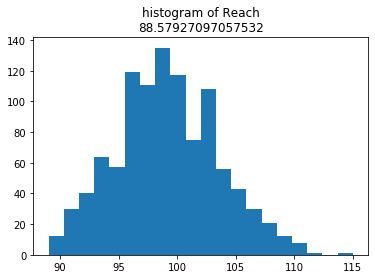

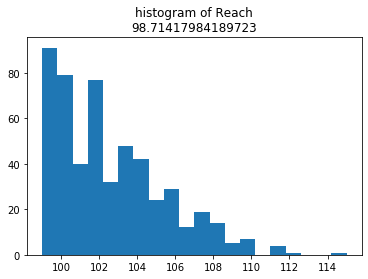

In [186]:
re_min = df['Reach'].min()

jbs_6 = []
thresholds = np.linspace(re_min, re_mu, 10)
for threshold in thresholds:
    vals = df[df['Reach'].fillna(re_mu)>threshold]['Reach'].fillna(re_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Reach\n{}".format(threshold))
    plt.show()
    jb_6=scs.jarque_bera(vals)
    jbs_6.append(jb_6[0])

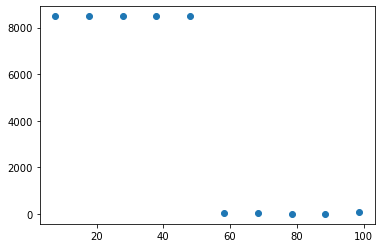

In [187]:
plt.scatter(thresholds, jbs_6)

In [188]:
#8 Height

In [189]:
ht_mu = df['Height'].mean()
ht_std = df['Height'].std()
print(ht_mu, ht_std)
lower_95 = ht_mu-2*ht_std
df.shape, df[df['Height']>87].shape

75.09419466403162 5.246044529301447


((1059, 25), (1, 25))

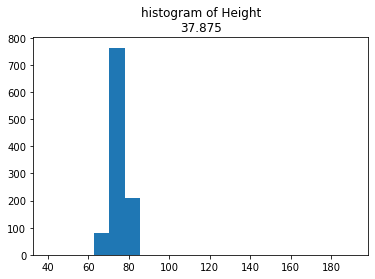

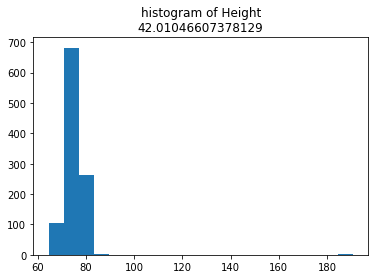

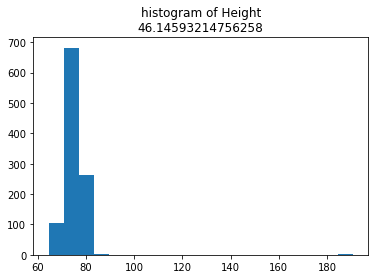

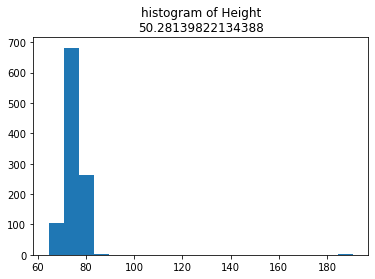

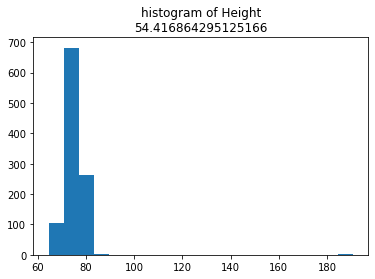

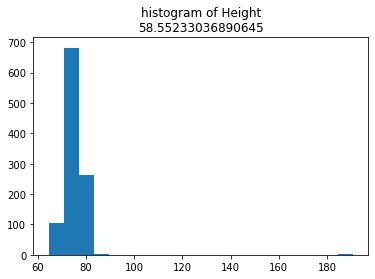

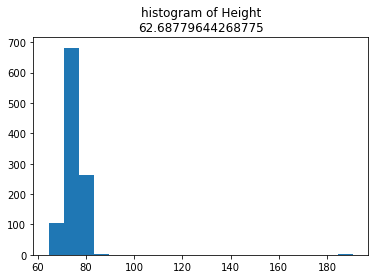

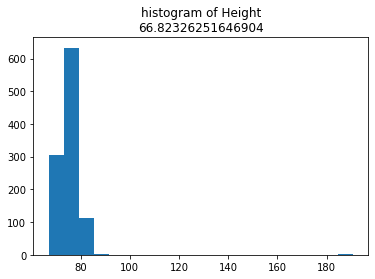

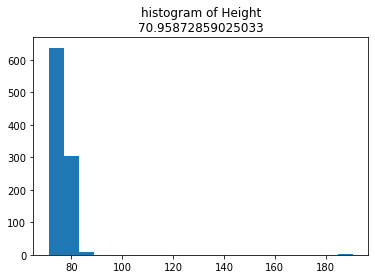

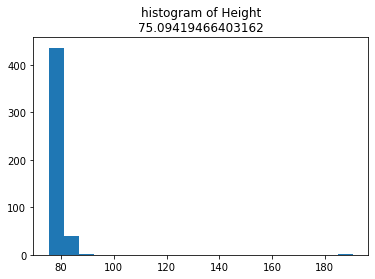

In [190]:
ht_min = df['Height'].min()

jbs_7 = []
thresholds = np.linspace(ht_min, ht_mu, 10)
for threshold in thresholds:
    vals = df[df['Height'].fillna(ht_mu)>threshold]['Height'].fillna(ht_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Height\n{}".format(threshold))
    plt.show()
    jb_7=scs.jarque_bera(vals)
    jbs_7.append(jb_7[0])

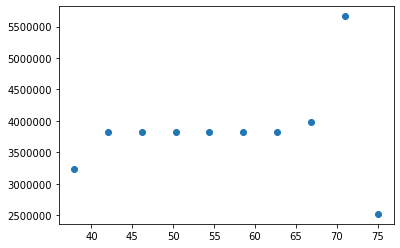

In [191]:
plt.scatter(thresholds, jbs_7)

In [192]:
#9 Weight

In [193]:
wt_mu = df['Weight'].mean()
wt_std = df['Weight'].std()
print(av_mu, av_std)
lower_95 = wt_mu-2*wt_std
df.shape, df[df['Weight']>280].shape

31.829614604462474 3.5479850939588244


((1059, 25), (4, 25))

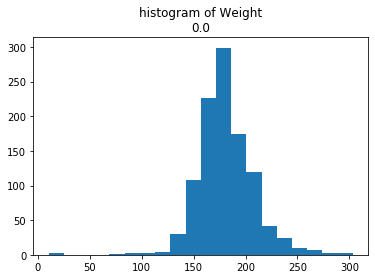

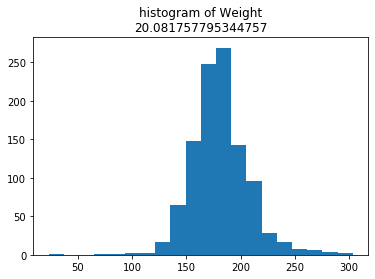

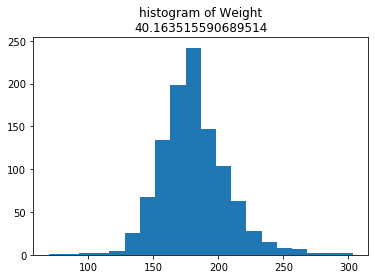

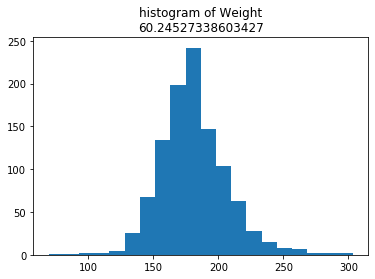

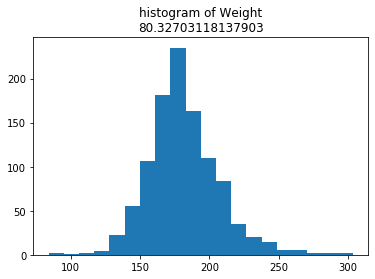

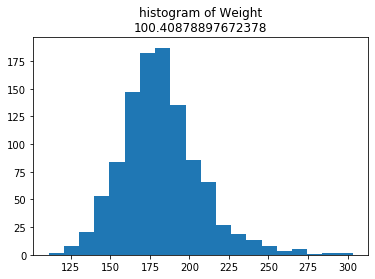

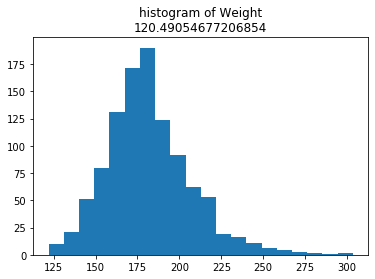

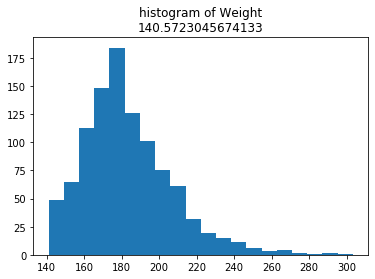

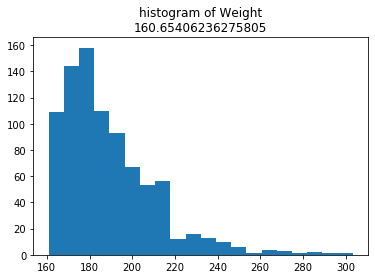

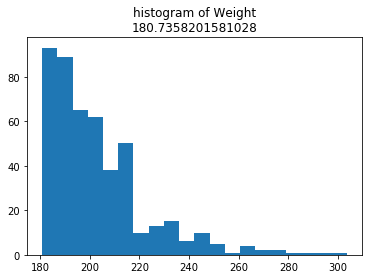

In [194]:
wt_min = df['Weight'].min()

jbs_8 = []
thresholds = np.linspace(wt_min, wt_mu, 10)
for threshold in thresholds:
    vals = df[df['Weight'].fillna(wt_mu)>threshold]['Weight'].fillna(wt_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Weight\n{}".format(threshold))
    plt.show()
    jb_8=scs.jarque_bera(vals)
    jbs_8.append(jb_8[0])

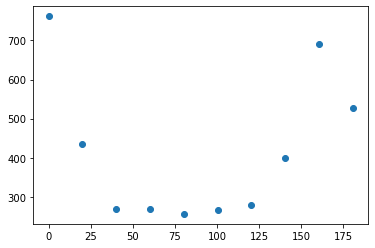

In [195]:
plt.scatter(thresholds, jbs_8)

In [196]:
#10 Body Comp

In [197]:
bc_mu = df['Body Comp'].mean()
bc_std = df['Body Comp'].std()
print(bc_mu, bc_std)
lower_95 = bc_mu-2*bc_std
df.shape, df[df['Body Comp']>33].shape

14.97949604743083 6.191146804644591


((1059, 25), (2, 25))

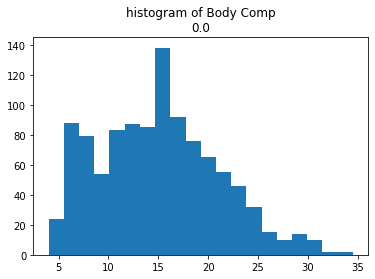

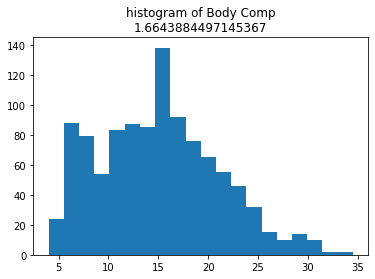

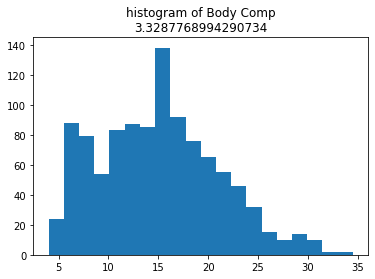

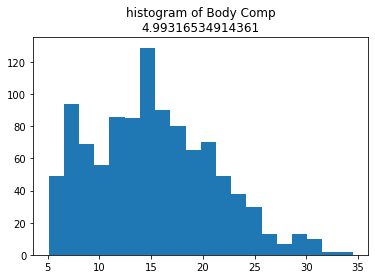

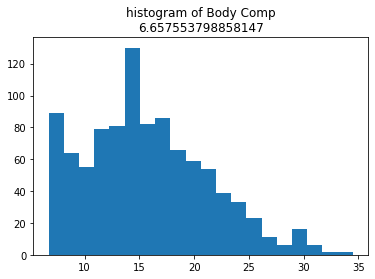

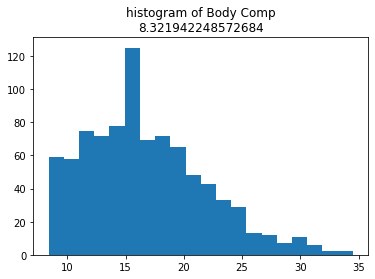

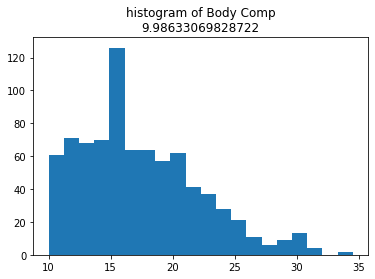

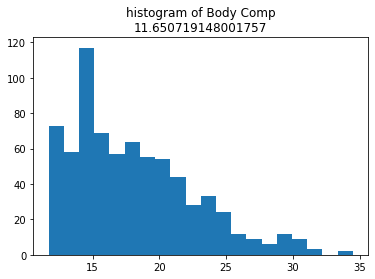

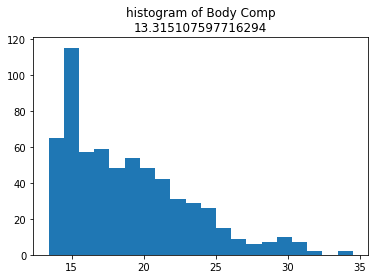

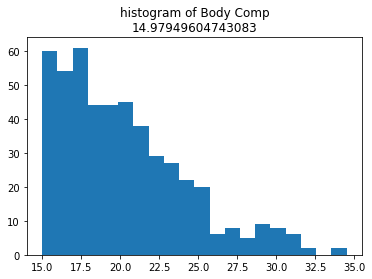

In [198]:
bc_min = df['Body Comp'].min()

jbs_9 = []
thresholds = np.linspace(bc_min, bc_mu, 10)
for threshold in thresholds:
    vals = df[df['Body Comp'].fillna(bc_mu)>threshold]['Body Comp'].fillna(bc_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Body Comp\n{}".format(threshold))
    plt.show()
    jb_9=scs.jarque_bera(vals)
    jbs_9.append(jb_9[0])

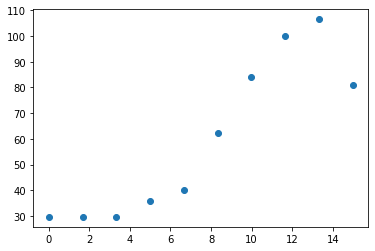

In [199]:
plt.scatter(thresholds, jbs_9)

In [200]:
# 11 Hand Width

In [201]:
hw_mu = df['Hand Width'].mean()
hw_std = df['Hand Width'].std()
print(hw_mu, hw_std)
lower_95 = hw_mu-2*hw_std
df.shape, df[df['Hand Width']>11].shape

8.876189296333004 0.6540954411061081


((1059, 25), (0, 25))

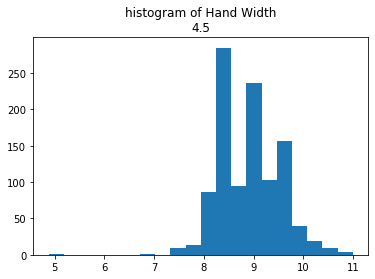

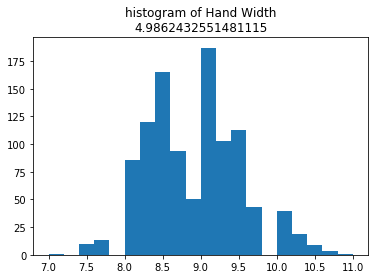

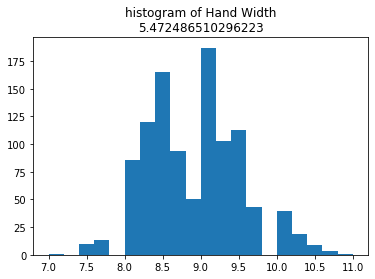

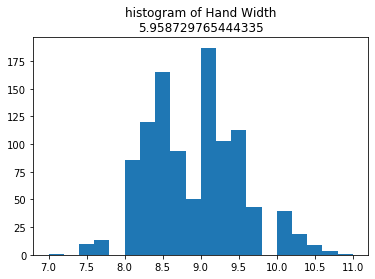

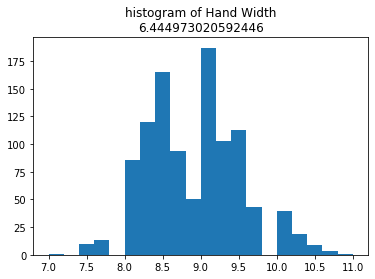

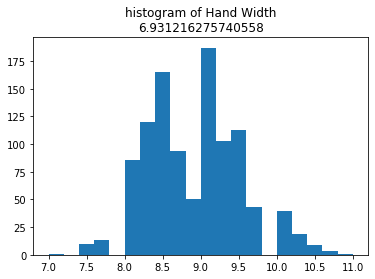

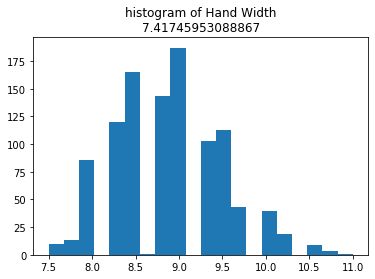

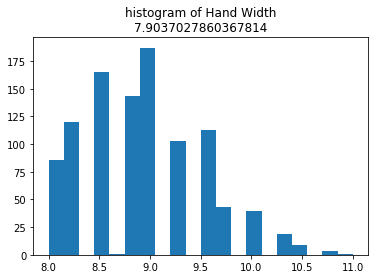

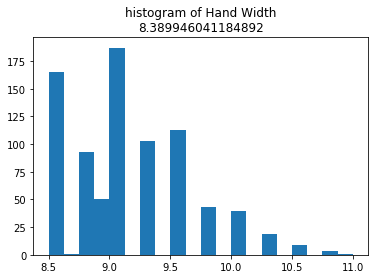

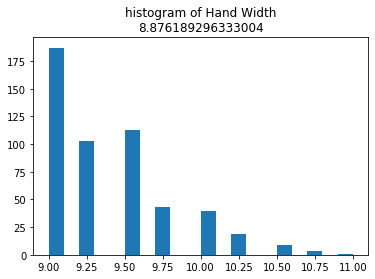

In [202]:
hw_min = df['Hand Width'].min()

jbs_10 = []
thresholds = np.linspace(hw_min, hw_mu, 10)
for threshold in thresholds:
    vals = df[df['Hand Width'].fillna(hw_mu)>threshold]['Hand Width'].fillna(hw_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Hand Width\n{}".format(threshold))
    plt.show()
    jb_10=scs.jarque_bera(vals)
    jbs_10.append(jb_10[0])

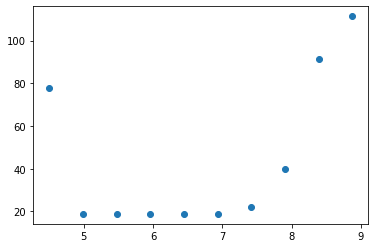

In [203]:
plt.scatter(thresholds, jbs_10)

## K-Nearest Neighbor Classifier

In [204]:
df.columns

Index(['BAMid', 'Approach Vertical', 'Vertical Jump', '3/4 Court sprint  ',
       '4-Way agility', 'Reaction Shuttle', 'BAMScore', 'Wingspan', 'Reach',
       'Height', 'Weight', 'Body Comp', 'Hand Width', 'approach_vertical_rank',
       'vertical_jump_rank', 'reaction_shuttle_rank', 'bam_score_rank',
       'wingspan_rank', 'reach_rank', 'height_rank', 'weight_rank',
       'body_comp_rank', 'hand_width_rank', 'fourway_rank',
       'courtsprint_rank'],
      dtype='object')

In [205]:
x.isna().sum()

Approach Vertical     0
Vertical Jump         0
3/4 Court sprint      0
4-Way agility         0
Reaction Shuttle      0
Wingspan              0
Reach                 0
Height                0
Weight                0
Body Comp             0
Hand Width            0
dtype: int64

In [206]:
df.mean()

# Just to check that we have all means for columns

Approach Vertical           31.829615
Vertical Jump               25.860157
3/4 Court sprint             3.467047
4-Way agility               12.247189
Reaction Shuttle             3.505243
BAMScore                  1890.976326
Wingspan                    78.089797
Reach                       98.714180
Height                      75.094195
Weight                     180.735820
Body Comp                   14.979496
Hand Width                   8.876189
approach_vertical_rank       3.324835
vertical_jump_rank           3.406988
reaction_shuttle_rank        3.372993
bam_score_rank               3.479698
wingspan_rank                3.339943
reach_rank                   3.414542
height_rank                  3.366383
weight_rank                  3.362606
body_comp_rank               3.372993
hand_width_rank              3.385269
fourway_rank                 3.346553
courtsprint_rank             3.306893
dtype: float64

In [207]:
df.fillna(value=df.mean(), inplace=True)

# Inplace = true does it permanently, false does not
# Made mistake, should have cleaned this data in beggining and ran through. Future Work!

In [208]:
x = df[['Reaction Shuttle','4-Way agility', 'Vertical Jump','3/4 Court sprint  ']]
y = df[['BAMScore']]

# Add more x param to increase r2 score

In [209]:
# Which contributes the most to BAMScore

In [210]:
from sklearn.model_selection import train_test_split

#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html

In [211]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.10)

In [212]:
display(x.head(2))
display(x_train.head(2))
display(x_test.head(2))

# 

,Reaction Shuttle,4-Way agility,Vertical Jump,3/4 Court sprint
0,3.669,11.471,28.5,3.376
1,3.355,12.114,21.5,3.486


,Reaction Shuttle,4-Way agility,Vertical Jump,3/4 Court sprint
862,3.505243,11.676,24.0,3.278
877,3.510000,12.293,28.0,3.217


,Reaction Shuttle,4-Way agility,Vertical Jump,3/4 Court sprint
536,3.889,11.388,24.5,3.691
646,3.624,12.105,28.0,3.671


In [213]:
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
neigh = KNeighborsRegressor(n_neighbors=3)
neigh.fit(x_train, y_train)

KNeighborsRegressor(n_neighbors=3)

In [214]:
neigh.score(x_test, y_test)

# 68-81%

0.7950938779941539

## Decision Tree Regressor

In [215]:
from sklearn.tree import DecisionTreeRegressor # Import Decision Tree Regressor
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

# https://www.datacamp.com/community/tutorials/decision-tree-classification-python

### 1 - Relationship to anthros with protocols
### 2 - Just protocols
### 3 - Body majorments (anthros)

In [216]:
print(x_train)

      Reaction Shuttle  4-Way agility  Vertical Jump  3/4 Court sprint  
862           3.505243      11.676000           24.0            3.278000
877           3.510000      12.293000           28.0            3.217000
40            3.663000      12.791000           24.5            3.426000
55            3.810000      11.818000           31.5            3.323000
143           3.505243      12.247189           29.5            3.467047
...                ...            ...            ...                 ...
165           3.755000      12.793000           29.0            3.537000
496           3.609000      11.634000           24.0            3.443000
1037          3.530000      12.542000           25.5            3.433000
373           3.092000      12.303000           25.0            3.519000
771           3.714000      12.600000           21.0            3.573000

[953 rows x 4 columns]


### #1 All feature columns

In [217]:
feature_cols = ['Approach Vertical',
                'Vertical Jump',
                '3/4 Court sprint  ',
                '4-Way agility',
                'Reaction Shuttle',
                'Wingspan',
                'Reach','Height',
                'Weight',
                'Body Comp',
                'Hand Width']

In [218]:
x = df[feature_cols] # Features
y = df.BAMScore

In [219]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)
# 70% training and 30% test

In [220]:
# Create Decision Tree Regressor object
clf = DecisionTreeRegressor()

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [221]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",clf.score(x_test,y_test))

Accuracy: 0.6844949097701881


### #2 Protocols

In [222]:
feature_cols_no_bodycomp = ['Approach Vertical', 'Vertical Jump', '3/4 Court sprint  ',
       '4-Way agility', 'Reaction Shuttle']

In [223]:
x = df[feature_cols_no_bodycomp] # Features
y = df.BAMScore

In [224]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)
# 70% training and 30% test

In [225]:
# Create Decision Tree Regressor object
clf = DecisionTreeRegressor()

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [226]:
# Model Accuracy, how often is the classifier correct?
# cleaning of my data may effect this, accuracy will go up after cleaned in begging.
print("Accuracy:",clf.score(x_test,y_test))

Accuracy: 0.7512390607574111


### #3 Only Anthros

In [227]:
feature_cols_anthros = ['Wingspan', 'Reach', 'Height', 'Weight', 'Body Comp', 'Hand Width']

In [228]:
x = df[feature_cols_anthros] # Features
y = df.BAMScore

In [229]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)
# 70% training and 30% test

In [230]:
# Create Decision Tree Regressor object
clf = DecisionTreeRegressor()

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [231]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",clf.score(x_test,y_test))

Accuracy: -0.3198726437899042


In [232]:
# No correlation between athletic ability and body comp
# Reclean data in traintest models that were discovered in future
# Split performance gap analysis more

In [233]:
!pwd

/Users/bryanjamieson/flatiron/BAM-DATA-FINAL
